In [1]:
from PIL import Image             # Python Imaging Library
import numpy as np                # Numerical Python 
import matplotlib.pyplot as plt   # Python plotting
import tifffile as tiff
from numba import vectorize
from timeit import default_timer as timer 
from scipy.optimize import curve_fit
import scipy.fftpack as fp
import cv2 as cv
from math import gamma

In [2]:
Filename = 'DUP_np8_tseries_29'
images = tiff.imread(Filename + '.tiff' )
#images = tiff.imread('myMultipageFile512_0.5_700_cut_500.tif')
shape_img = images.shape
print(shape_img)
N_t = shape_img[0]
pixels = np.min(shape_img[1:2])
print(pixels)
#d_pix = 0.21 #video tanja
d_pix = 0.1318 #videos de Mayra
#d_pix = 0.18 #videos iniciales part MAyra Florencia
#d_pix = 0.2838
#d_pix = 0.48 #video Erick
M = 63
#timestep = 1/30    #tanja
#timestep = 0.1 #Erick
timestep = 0.244 #Mayra
#timestep = 0.03588  #iniciales florencia
num_intervals = 100
imagefft_size=[N_t*pixels,pixels]
dfts_und = np.zeros(imagefft_size,'complex64')
Image = images[0]


Fourier_sp_corr = np.zeros([(num_intervals - 1)*pixels, pixels])
Fourier_sp_diff = np.zeros([(num_intervals - 1)*pixels, pixels])


@vectorize(["complex64(complex64, complex64)"], target = 'cpu')
def Complex_mult(a,b):
    #return  (a * b)
    return (a * b)

@vectorize(["float32(complex64, complex64)"], target = 'cpu')
def DF_spectrum(a,b):
    return  (abs(a - b.conjugate()))**2
    

a=0
b=pixels
for i in range(0,N_t):    
    dfts_und[a:b,:]=((d_pix/M)**2)*np.complex64(fp.fft2(images[i]))
    #dfts_und[a:b,:]=((d_pix/M)**2)*cv.dft(np.float32(images[i]), flags = cv.DFT_COMPLEX_OUTPUT)
    print(i)
    a = a+pixels
    b = b+pixels

    
dfts_for = dfts_und.conjugate()
p = N_t - 1
a = 0
b = pixels

delta_array = np.zeros(imagefft_size,'complex64')
delta_array = Complex_mult(dfts_und, dfts_for)
delta_array = np.reshape(delta_array,[N_t, pixels, pixels], order = 'A').mean(axis = 0)
delta_array = (abs(delta_array))
#zero_array = np.zeros(imagefft_size,'complex64')
#zero_array = DF_spectrum(dfts_und, dfts_for)
#zero_array = np.reshape(zero_array,[N_t, pixels, pixels], order = 'A').mean(axis = 0)

for j in range(1,num_intervals):
    start = timer()
    dfts_und = np.delete(dfts_und, np.s_[-pixels:],0 )
    dfts_for = np.delete(dfts_for, np.s_[0:pixels],0 )
    
    diff = DF_spectrum(dfts_und, dfts_for)
    Fourier_sp_diff[a:b, :] = np.reshape(diff,[p, pixels, pixels], order = 'A').mean(axis = 0)
    
    cross_corr = Complex_mult(dfts_und, dfts_for)
    cross_corr_mean = np.reshape(cross_corr,[p, pixels, pixels], order = 'A').mean(axis = 0)
    Fourier_sp_corr[a:b,:] = (abs(cross_corr_mean))
    
    p = p -1
    a = a + pixels
    b = b + pixels
    Complex_mult_time = timer() - start
    print("Complex_mult_time took %f seconds" % Complex_mult_time)
    
Fourier_sp_corr = np.concatenate((delta_array, Fourier_sp_corr), axis=0)    
#Fourier_sp_diff = np.concatenate((zero_array, Fourier_sp_corr), axis=0)     

(250, 512, 512)
512


C:\ProgramData\Anaconda3\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
Complex_mult_time took 1.592195 seconds
Complex_mult_time took 3.663881 seconds
Complex_mult_time took 1.86435

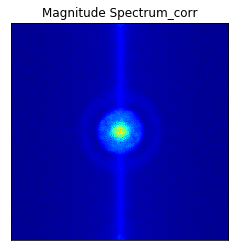

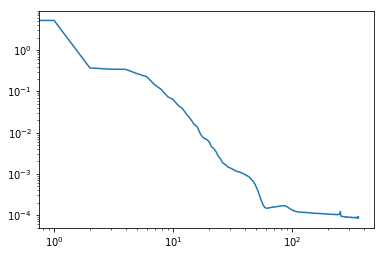

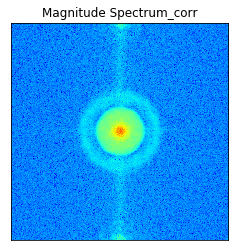

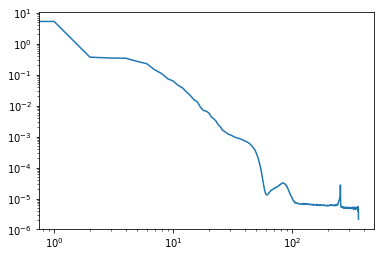

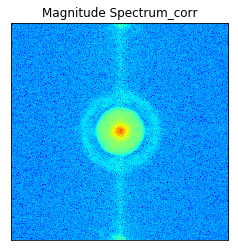

...

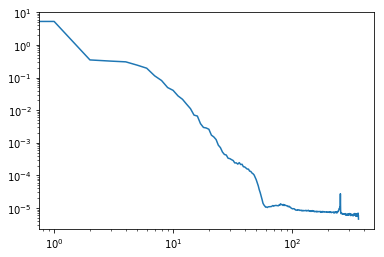

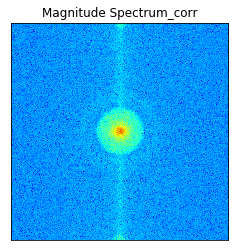

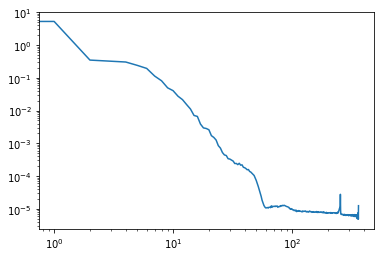

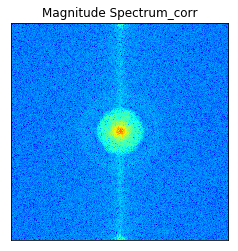

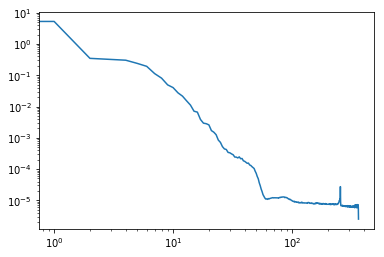

In [3]:
#Arreglo para evaluar F(Q,t)
FQt_array = np.zeros([num_intervals-1,363]) 
l= 0
m=pixels 

for n in range(0,num_intervals-1):
    shift_corr= np.fft.fftshift(Fourier_sp_corr[l:m,:])
    center = [(pixels/2)-1,(pixels/2)-1]
    
    y, x = np.indices((shift_corr.shape))
    #print(x)
    #print(y)
    
    r = np.sqrt((x - center[0])**2 + (y - center[1])**2)
    r = r.astype(np.int)
   
    #print(np.min(r))
    tbin = np.bincount(r.ravel(), shift_corr.ravel())
    #print("rravel es ", r.ravel())
    #print("mag spe es", shift_corr)
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    #print("radial profile is", radialprofile)
    #print("nr es", nr)
    #print(magnitude_spectrum_diff[511,511])
    #print((magnitude_spectrum_diff[255,256]+magnitude_spectrum_diff[255,254]+magnitude_spectrum_diff[256,255]+magnitude_spectrum_diff[254,255]+magnitude_spectrum_diff[256,256]+magnitude_spectrum_diff[254,256]+magnitude_spectrum_diff[254,254]+magnitude_spectrum_diff[256,254])/8)
    #print("The max is r ",np.max(r))
    plt.plot(),plt.imshow(20*cv.log(shift_corr), cmap = 'jet')
    plt.title('Magnitude Spectrum_corr'), plt.xticks([]), plt.yticks([])
    plt.show()
    l=l+pixels
    m=m+pixels
    t=np.linspace(0,362,num =363)
    plt.loglog(t,radialprofile , label='linear')
    plt.show()
    FQt_array[n,:] = radialprofile

#print("The array then is", FQt_array)

0.9310960776240614


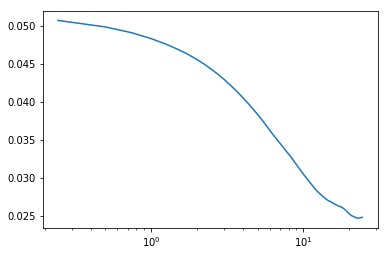

1.0242056853864674


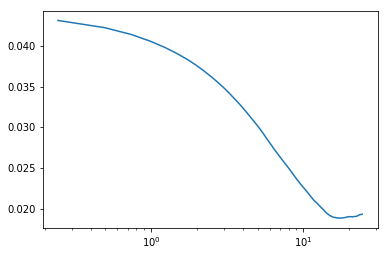

1.1173152931488737


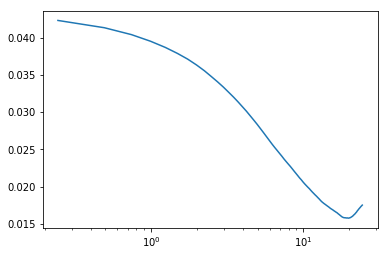

1.21042490091128


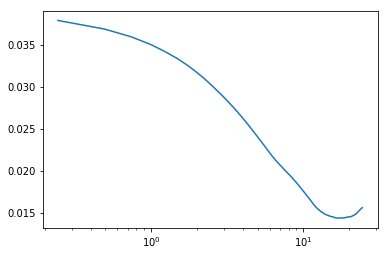

1.303534508673686


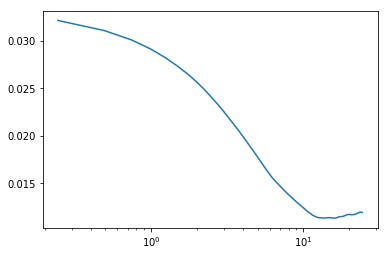

1.396644116436092


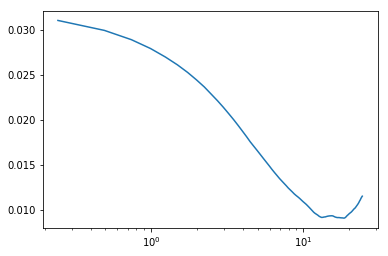

1.4897537241984982


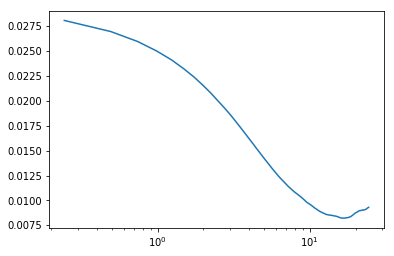

1.5828633319609045


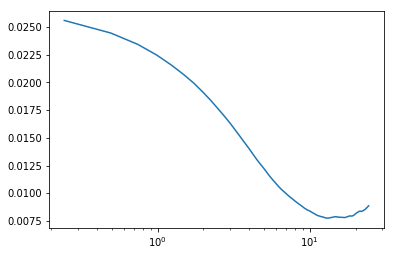

1.6759729397233105


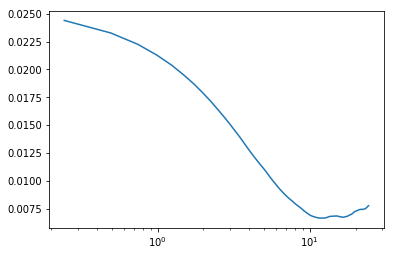

1.7690825474857166


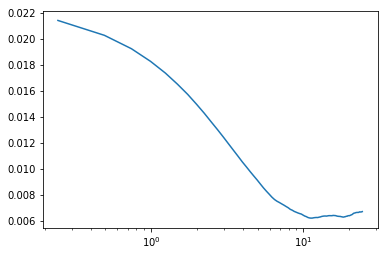

1.8621921552481229


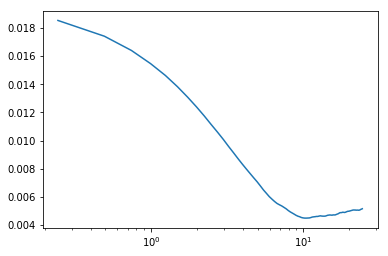

1.9553017630105292


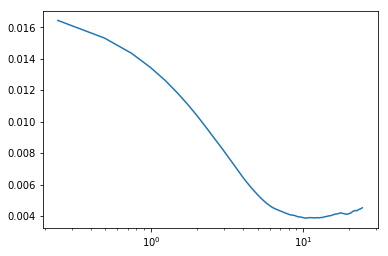

2.048411370772935


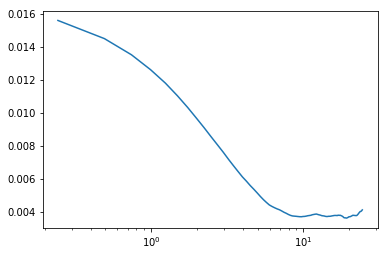

2.141520978535341


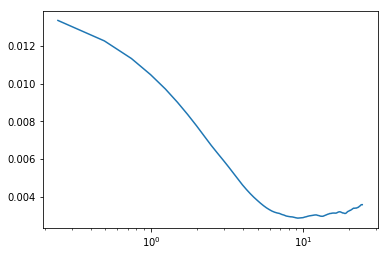

2.2346305862977474


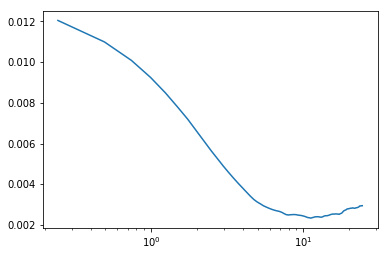

2.3277401940601536


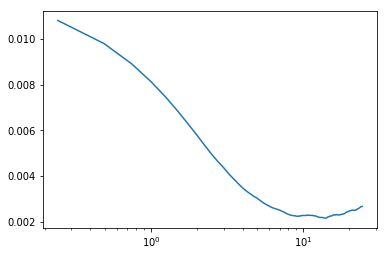

2.42084980182256


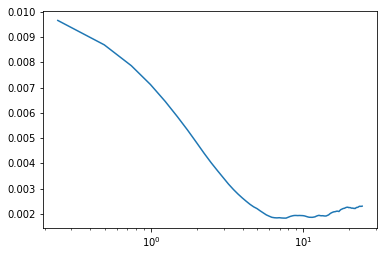

2.5139594095849658


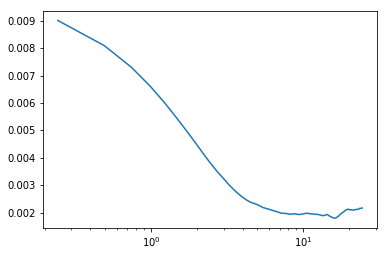

2.607069017347372


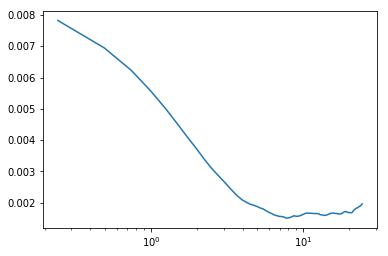

2.7001786251097784


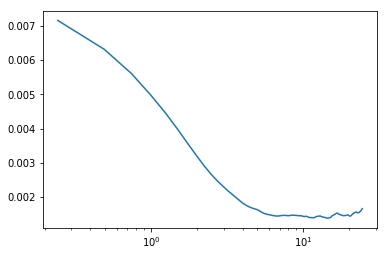

2.793288232872184


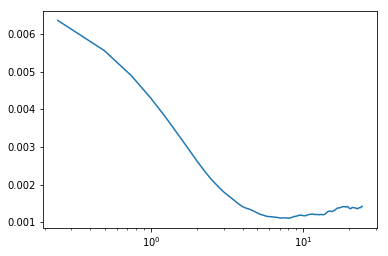

2.88639784063459


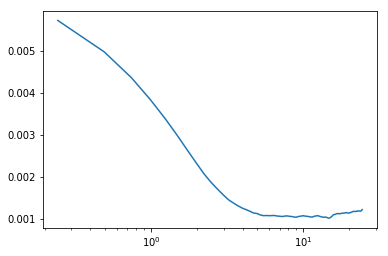

2.9795074483969963


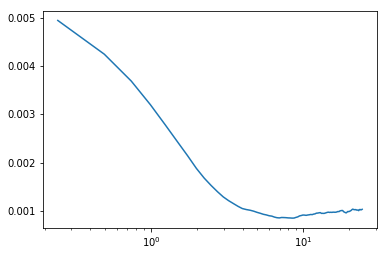

3.0726170561594026


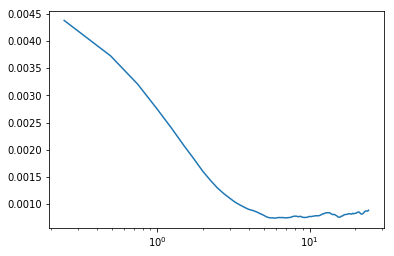

3.165726663921809


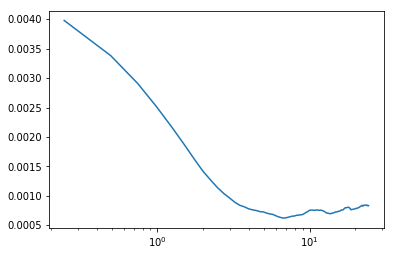

3.2588362716842147


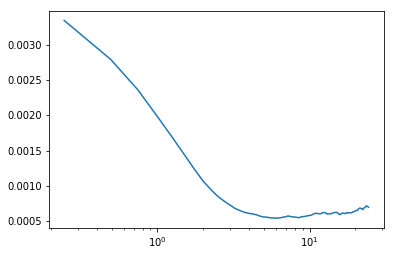

3.351945879446621


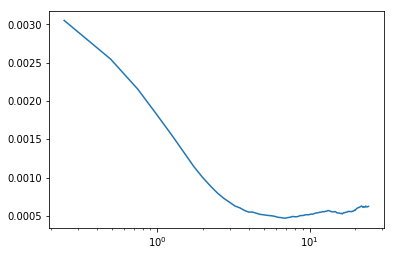

3.4450554872090273


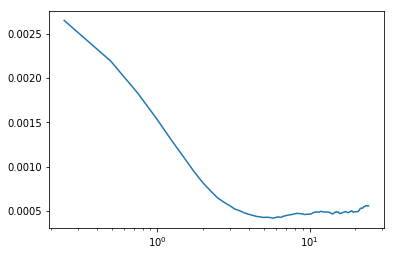

3.538165094971433


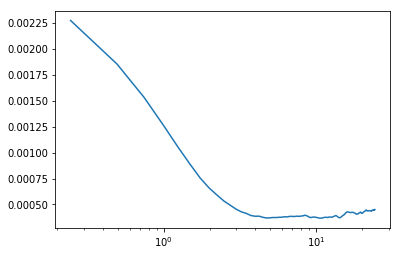

3.6312747027338395


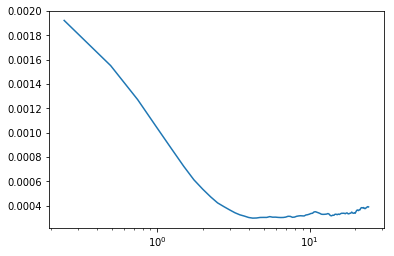

3.7243843104962457


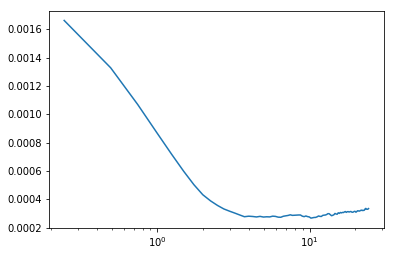

3.8174939182586516


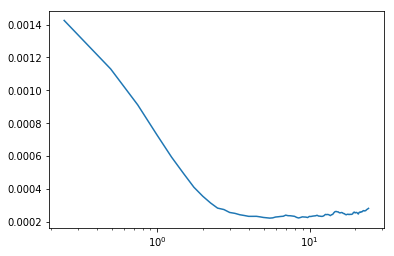

3.9106035260210583


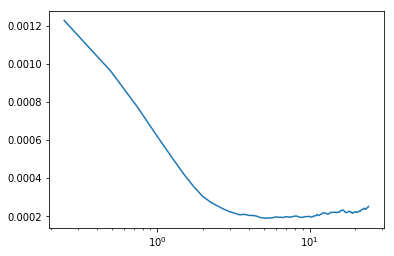

4.003713133783464


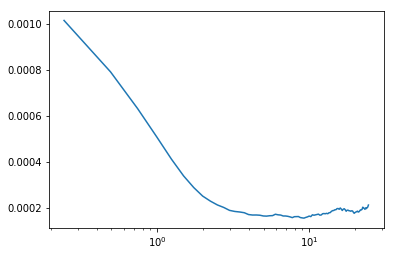

4.09682274154587


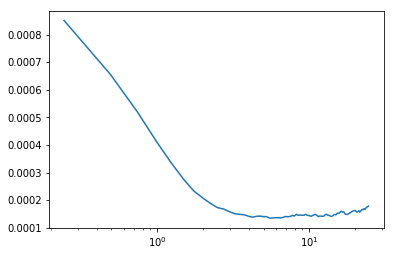

4.189932349308276


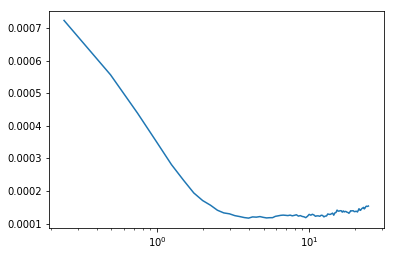

4.283041957070682


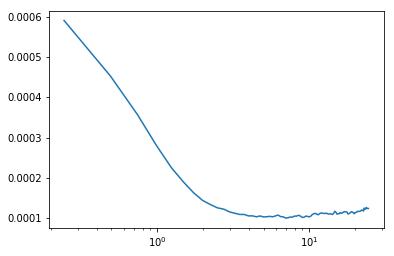

4.376151564833089


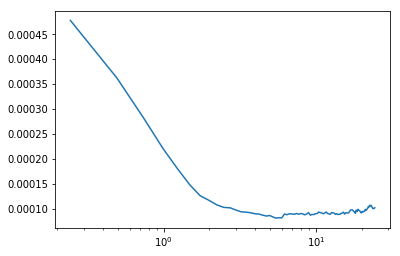

4.469261172595495


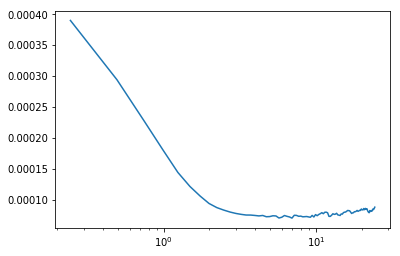

4.562370780357901


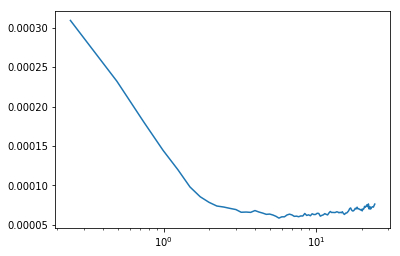

4.655480388120307


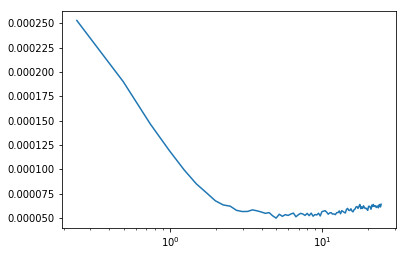

4.748589995882713


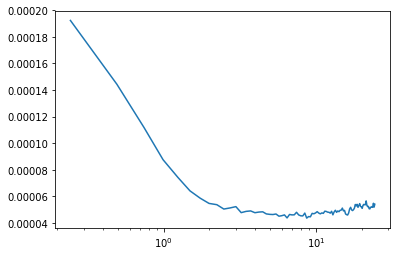

4.84169960364512


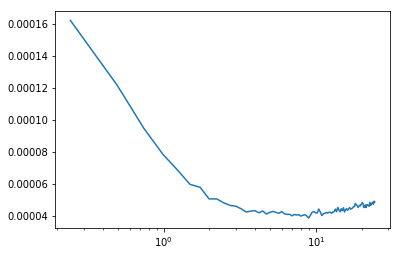

4.934809211407526


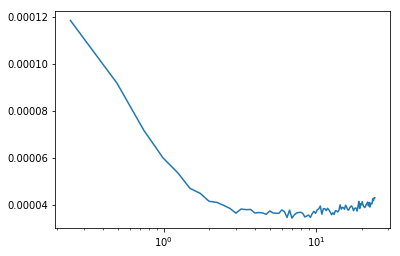

5.0279188191699316


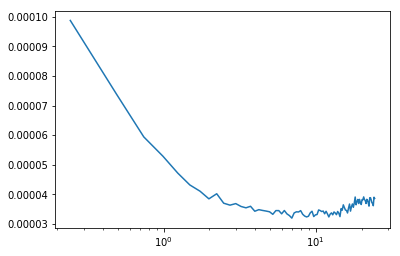

5.121028426932338


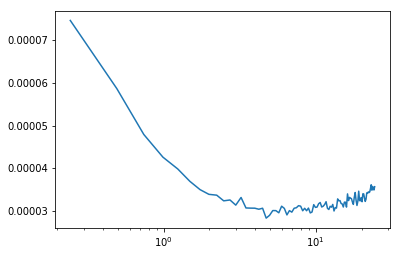

5.214138034694744


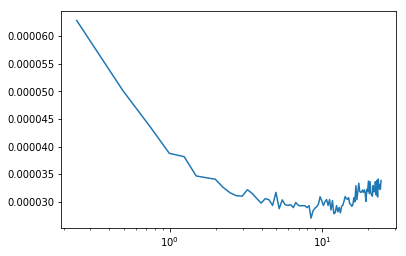

5.30724764245715


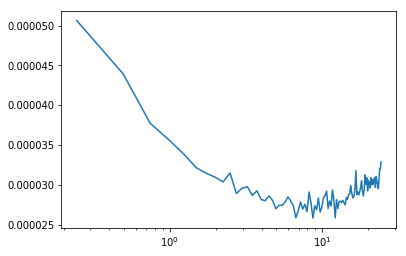

5.400357250219557


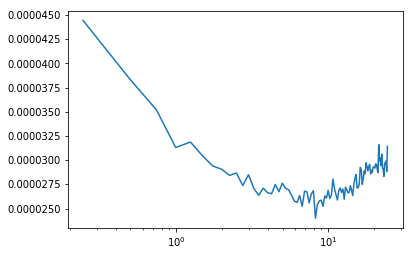

5.4934668579819625


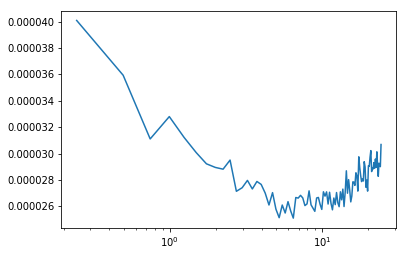

5.586576465744368


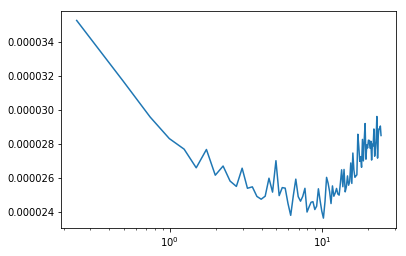

5.679686073506774


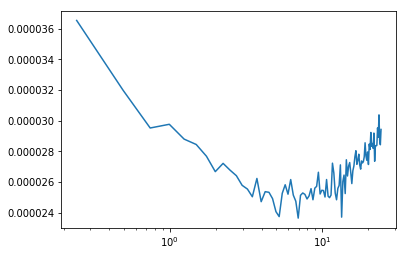

5.77279568126918


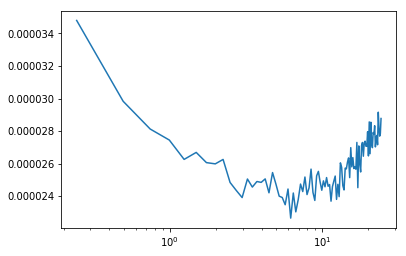

5.865905289031587


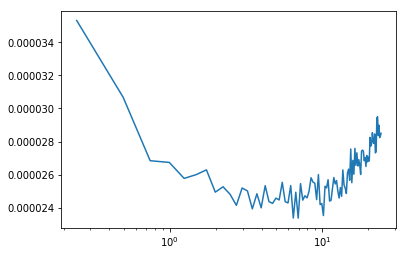

5.959014896793993


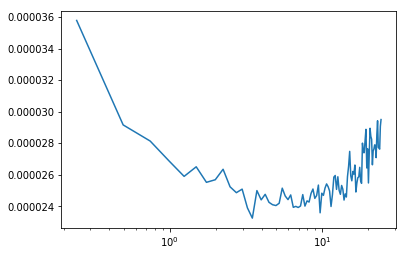

6.0521245045563985


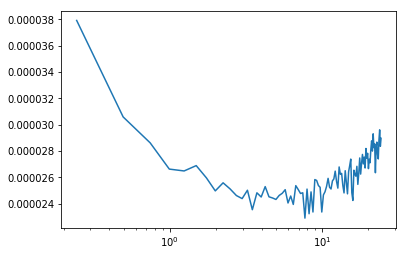

6.145234112318805


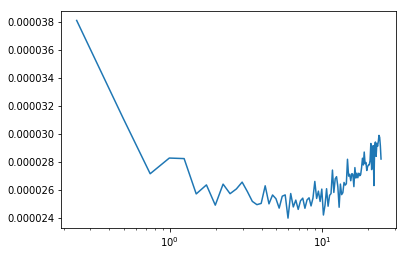

6.238343720081211


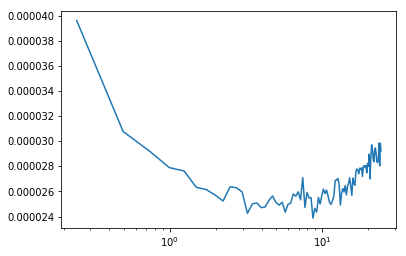

6.331453327843618


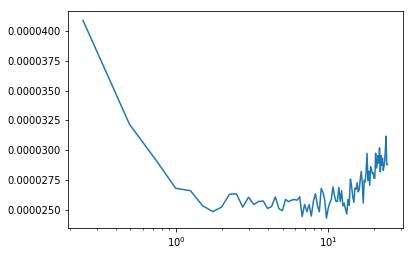

6.424562935606024


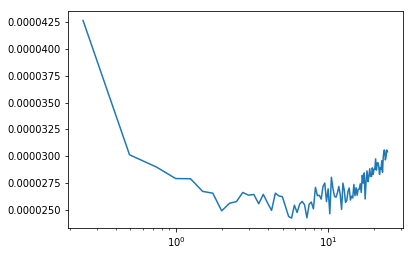

6.5176725433684295


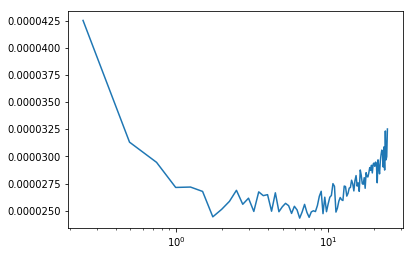

6.610782151130836


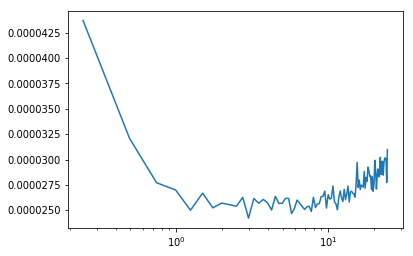

6.703891758893242


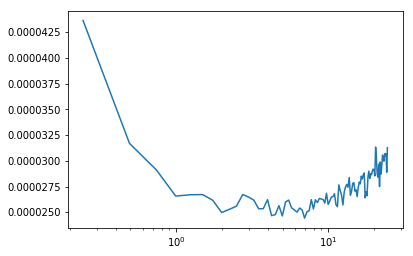

6.797001366655648


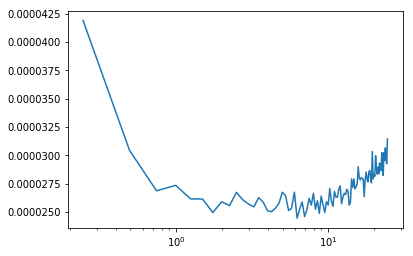

6.890110974418055


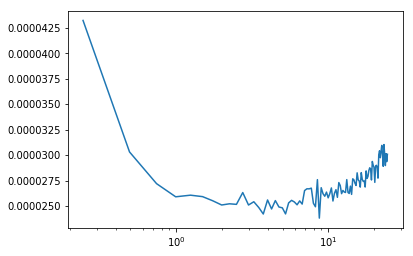

6.9832205821804605


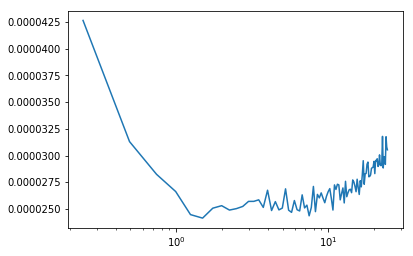

7.076330189942866


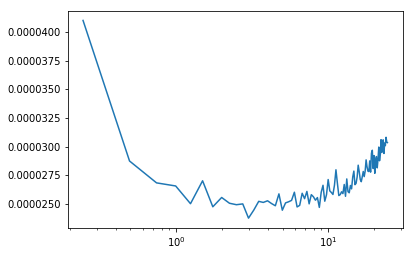

7.169439797705273


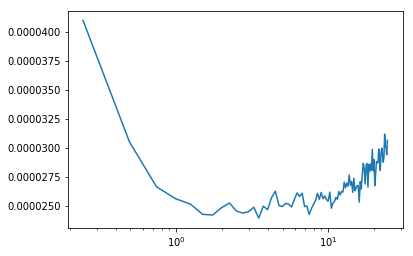

7.262549405467679


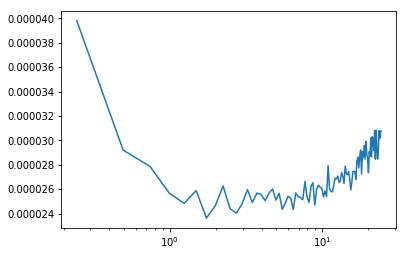

7.355659013230086


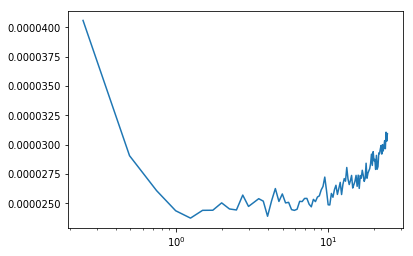

7.4487686209924915


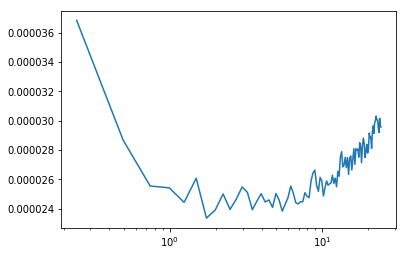

7.541878228754897


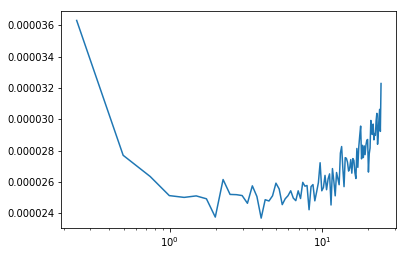

7.634987836517303


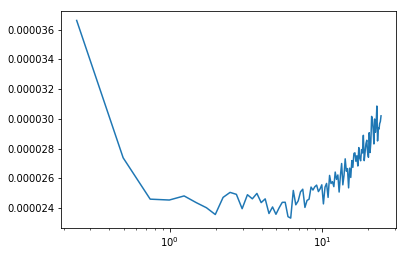

7.728097444279711


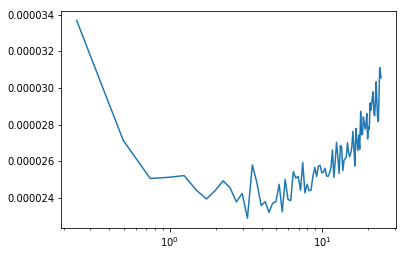

7.821207052042117


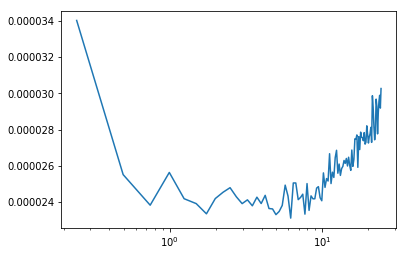

7.9143166598045225


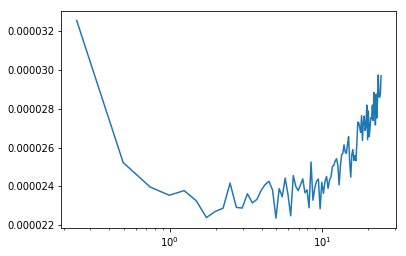

8.007426267566927


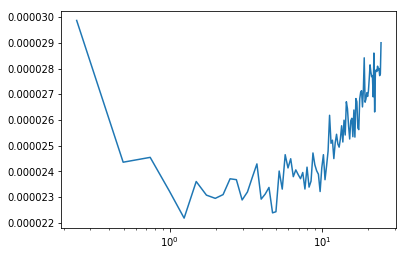

8.100535875329333


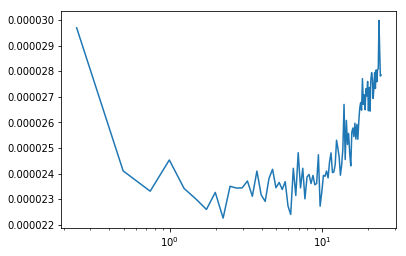

8.19364548309174


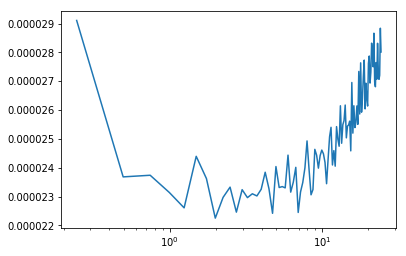

8.286755090854147


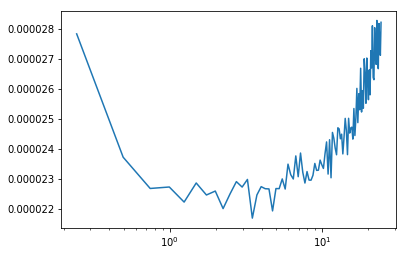

8.379864698616553


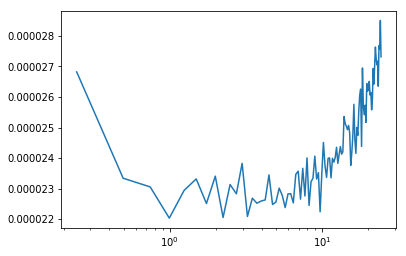

8.472974306378958


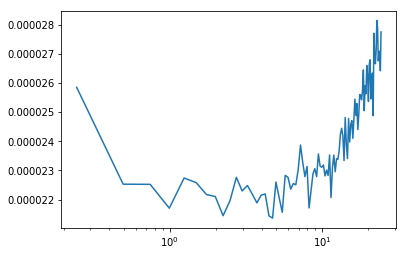

8.566083914141364


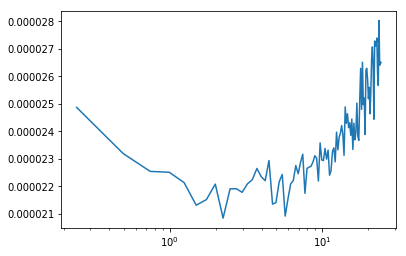

8.65919352190377


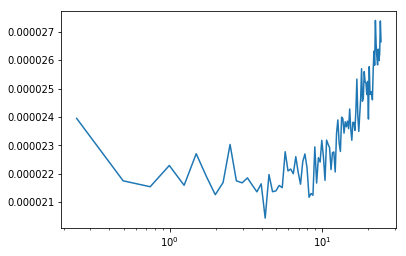

8.752303129666178


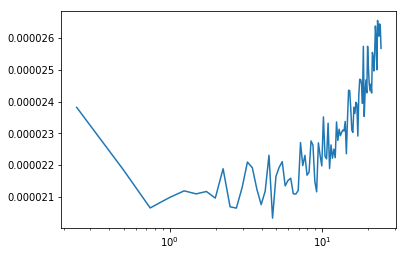

In [4]:
# Plotting correlation, obtaining A(q) 
i=0
num = 85
ini = 10
Q = np.zeros([num])
A_q_F = np.zeros([num])
C_q = np.zeros([num])
B_q_F = np.zeros([num])
f_q_corr = np.zeros([num, np.size(FQt_array[1:,1])])
f_q_fit_corr = np.zeros([num, np.size(FQt_array[1:,1])])
Time = np.zeros([num])

for h in range(ini,ini + num, 1):
    
    alli = FQt_array[1:,h] 
    apo = np.linspace( timestep, timestep*num_intervals, num_intervals-2 )
    plt.show()
    plt.semilogx(apo,alli, label='linear')
    
    q = (2*np.pi)*h/(d_pix*pixels)
    print(q)
    A_q_F[i] = FQt_array[1,h] 
    B_q_F[i] = FQt_array[0,h] - FQt_array[1,h]
    Q[i] = q
    i = i + 1

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022758 0.00018651 0.00021249 ... 0.00020462 0.00021249 0.00018651]
 [0.00019735 0.00020078 0.00019001 ... 0.00020531 0.00018628 0.00022846]
 [0.00017475 0.0002111  0.00019988 ... 0.0001685  0.00018975 0.00018253]
 ...
 [0.00020904 0.00021603 0.00021117 ... 0.00019767 0.00019372 0.00019595]
 [0.00017475 0.00018253 0.00018975 ... 0.00021418 0.00019988 0.0002111 ]
 [0.00019735 0.00022846 0.00018628 ... 0.000183   0.00019001 0.00020078]]
el max de R es 362


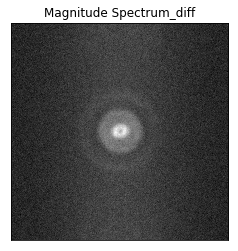

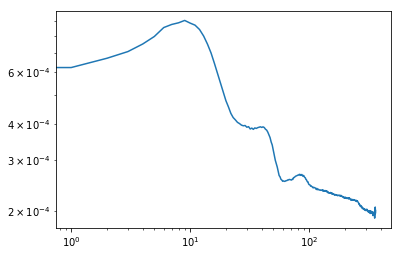

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021524 0.0001763  0.00020704 ... 0.00017824 0.00020704 0.0001763 ]
 [0.00019643 0.0002002  0.00018761 ... 0.00020325 0.00019383 0.00022507]
 [0.00016168 0.00020087 0.00020103 ... 0.00018103 0.00018597 0.00017768]
 ...
 [0.00020056 0.00020316 0.00020069 ... 0.00018937 0.00019309 0.0001952 ]
 [0.00016168 0.00017768 0.00018597 ... 0.00020929 0.00020103 0.00020087]
 [0.00019643 0.00022507 0.00019383 ... 0.00017975 0.00018761 0.0002002 ]]
el max de R es 362


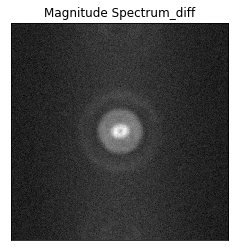

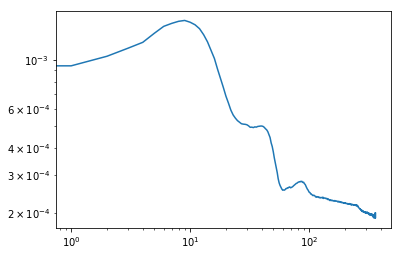

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022513 0.00018402 0.00020838 ... 0.00019317 0.00020838 0.00018402]
 [0.00019832 0.00018468 0.00018955 ... 0.00017724 0.0002157  0.00022587]
 [0.00015819 0.00019396 0.00019663 ... 0.00018395 0.00019661 0.00017801]
 ...
 [0.00020845 0.00020584 0.0001997  ... 0.00021047 0.00018602 0.00019212]
 [0.00015819 0.00017801 0.00019661 ... 0.00018781 0.00019663 0.00019396]
 [0.00019832 0.00022587 0.0002157  ... 0.00017849 0.00018955 0.00018468]]
el max de R es 362


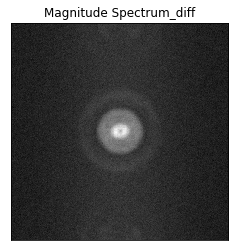

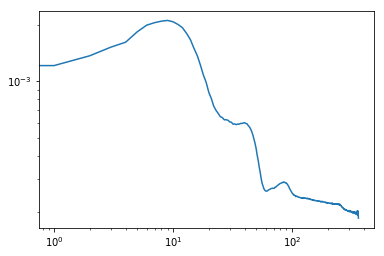

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020343 0.00017858 0.00021437 ... 0.0002191  0.00021437 0.00017858]
 [0.00018764 0.00020394 0.00020016 ... 0.00019497 0.00021603 0.00023126]
 [0.00016011 0.0001954  0.00019991 ... 0.00018049 0.00019853 0.00018462]
 ...
 [0.00020136 0.00021175 0.00020109 ... 0.00021097 0.00019869 0.00019158]
 [0.00016011 0.00018462 0.00019853 ... 0.00020662 0.00019991 0.0001954 ]
 [0.00018764 0.00023126 0.00021603 ... 0.00018887 0.00020016 0.00020394]]
el max de R es 362


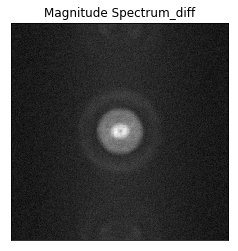

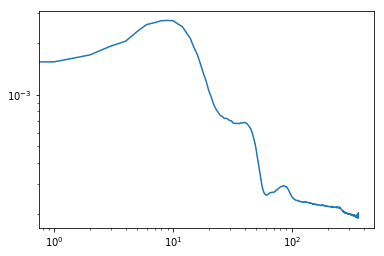

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00017702 0.00018655 0.00020943 ... 0.00018263 0.00020943 0.00018655]
 [0.00019201 0.00020239 0.00021246 ... 0.00020319 0.0001959  0.00022712]
 [0.00016353 0.00020395 0.00021562 ... 0.00017474 0.00018726 0.00016628]
 ...
 [0.00018764 0.00019964 0.00019569 ... 0.00021742 0.00019488 0.00019315]
 [0.00016353 0.00016628 0.00018726 ... 0.00018156 0.00021562 0.00020395]
 [0.00019201 0.00022712 0.0001959  ... 0.00017395 0.00021246 0.00020239]]
el max de R es 362


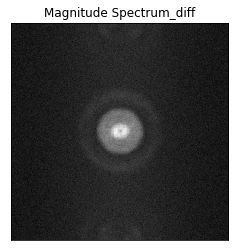

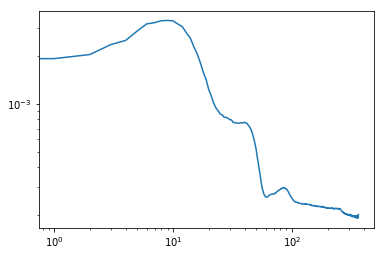

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020527 0.00018915 0.00019981 ... 0.00021592 0.00019981 0.00018915]
 [0.00018384 0.00019002 0.00021508 ... 0.00019857 0.00021694 0.00021837]
 [0.00016869 0.00020778 0.00019434 ... 0.00017557 0.00019444 0.00019655]
 ...
 [0.00020417 0.00021446 0.00019824 ... 0.00022415 0.00019452 0.00018129]
 [0.00016869 0.00019655 0.00019444 ... 0.00019677 0.00019434 0.00020778]
 [0.00018384 0.00021837 0.00021694 ... 0.00017935 0.00021508 0.00019002]]
el max de R es 362


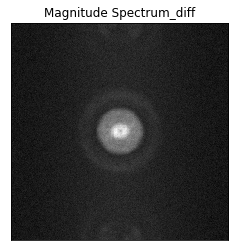

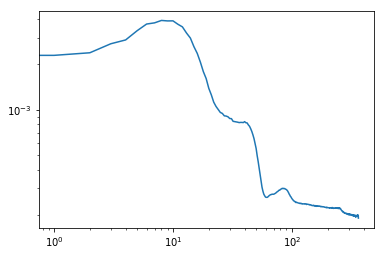

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020385 0.00017714 0.00020115 ... 0.00019261 0.00020115 0.00017714]
 [0.00021175 0.00019796 0.00021222 ... 0.00019624 0.000188   0.00022153]
 [0.0001707  0.00019949 0.00019112 ... 0.00017167 0.00017981 0.00018461]
 ...
 [0.00019014 0.00022164 0.00019602 ... 0.00020566 0.00018135 0.00018479]
 [0.0001707  0.00018461 0.00017981 ... 0.00019203 0.00019112 0.00019949]
 [0.00021175 0.00022153 0.000188   ... 0.00018451 0.00021222 0.00019796]]
el max de R es 362


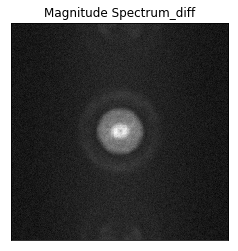

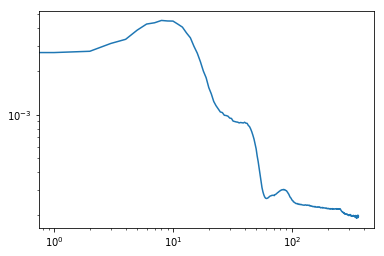

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022669 0.00017797 0.00020568 ... 0.00020686 0.00020568 0.00017797]
 [0.00018606 0.00019306 0.0002058  ... 0.0002131  0.00020118 0.00022192]
 [0.00017256 0.00020654 0.00019074 ... 0.0001836  0.00017602 0.00017738]
 ...
 [0.00018069 0.00021586 0.00020475 ... 0.00021126 0.00019953 0.00021031]
 [0.00017256 0.00017738 0.00017602 ... 0.00020206 0.00019074 0.00020654]
 [0.00018606 0.00022192 0.00020118 ... 0.00017006 0.0002058  0.00019306]]
el max de R es 362


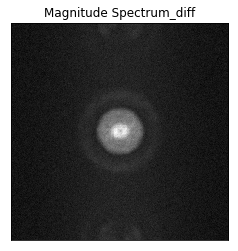

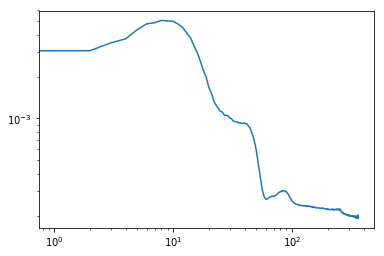

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021658 0.00019328 0.00021351 ... 0.00020517 0.00021351 0.00019328]
 [0.00019688 0.0001996  0.00019475 ... 0.00020958 0.00019926 0.00022043]
 [0.00017457 0.00019638 0.00020934 ... 0.00017841 0.00017519 0.00017537]
 ...
 [0.00019257 0.00022933 0.0001842  ... 0.00021074 0.0001941  0.00018384]
 [0.00017457 0.00017537 0.00017519 ... 0.00019518 0.00020934 0.00019638]
 [0.00019688 0.00022043 0.00019926 ... 0.00018416 0.00019475 0.0001996 ]]
el max de R es 362


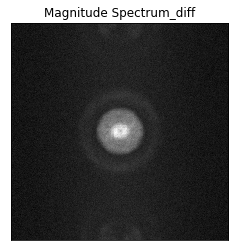

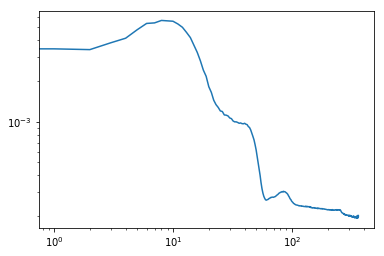

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022476 0.00019654 0.00021955 ... 0.00019366 0.00021955 0.00019654]
 [0.00019005 0.00020386 0.00018189 ... 0.00019139 0.00019654 0.00020922]
 [0.00016593 0.00019783 0.0001766  ... 0.00017392 0.00019276 0.00018001]
 ...
 [0.00018115 0.00021653 0.00018641 ... 0.00019993 0.00019144 0.00020157]
 [0.00016593 0.00018001 0.00019276 ... 0.00018845 0.0001766  0.00019783]
 [0.00019005 0.00020922 0.00019654 ... 0.00017523 0.00018189 0.00020386]]
el max de R es 362


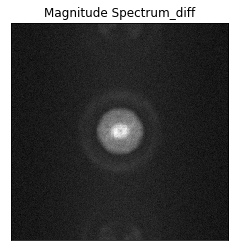

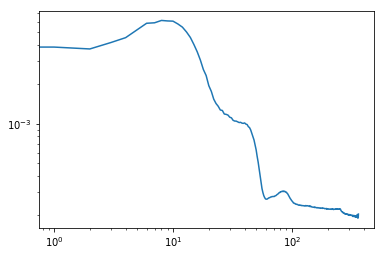

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018826 0.00019265 0.00019906 ... 0.00021419 0.00019906 0.00019265]
 [0.00019341 0.00019677 0.00018489 ... 0.00018763 0.00019569 0.00021   ]
 [0.00017379 0.00019332 0.00019242 ... 0.00018525 0.0002098  0.00019016]
 ...
 [0.00020289 0.00019714 0.00020047 ... 0.00020034 0.0002031  0.0001758 ]
 [0.00017379 0.00019016 0.0002098  ... 0.00020636 0.00019242 0.00019332]
 [0.00019341 0.00021    0.00019569 ... 0.0001786  0.00018489 0.00019677]]
el max de R es 362


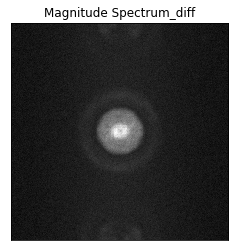

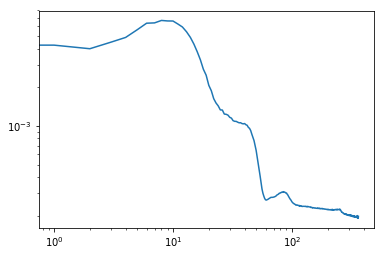

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020774 0.00018527 0.00018938 ... 0.00019955 0.00018938 0.00018527]
 [0.00018989 0.00018713 0.00018811 ... 0.00022232 0.00021402 0.00022301]
 [0.00017488 0.00019376 0.00018919 ... 0.00019042 0.00019997 0.00018086]
 ...
 [0.00019778 0.00023053 0.00019821 ... 0.00021163 0.00019271 0.00019906]
 [0.00017488 0.00018086 0.00019997 ... 0.00018675 0.00018919 0.00019376]
 [0.00018989 0.00022301 0.00021402 ... 0.00016952 0.00018811 0.00018713]]
el max de R es 362


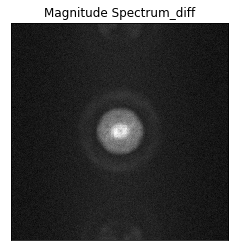

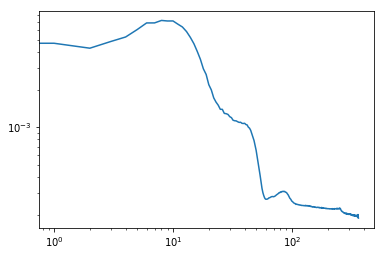

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021556 0.00018527 0.00020049 ... 0.00021362 0.00020049 0.00018527]
 [0.00019453 0.00019043 0.00018753 ... 0.0002008  0.00020335 0.00022552]
 [0.00016793 0.00020376 0.00019268 ... 0.00018205 0.00019705 0.00017923]
 ...
 [0.00018173 0.00020023 0.00019868 ... 0.00019903 0.00018994 0.0002075 ]
 [0.00016793 0.00017923 0.00019705 ... 0.00019816 0.00019268 0.00020376]
 [0.00019453 0.00022552 0.00020335 ... 0.00016947 0.00018753 0.00019043]]
el max de R es 362


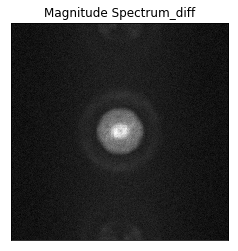

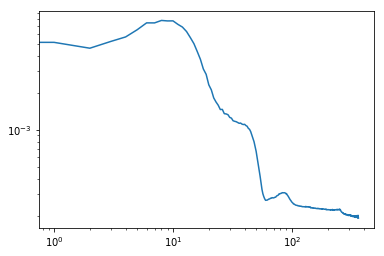

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002089  0.00017979 0.00020434 ... 0.00020162 0.00020434 0.00017979]
 [0.00018041 0.0001988  0.00020654 ... 0.00019996 0.00020287 0.00023868]
 [0.00016297 0.0001929  0.00019599 ... 0.00017456 0.00019623 0.00016205]
 ...
 [0.00019488 0.00022722 0.0002019  ... 0.00019878 0.00018356 0.00019588]
 [0.00016297 0.00016205 0.00019623 ... 0.00019855 0.00019599 0.0001929 ]
 [0.00018041 0.00023868 0.00020287 ... 0.00017153 0.00020654 0.0001988 ]]
el max de R es 362


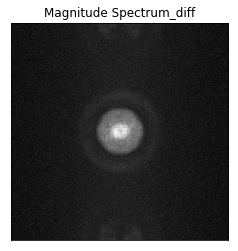

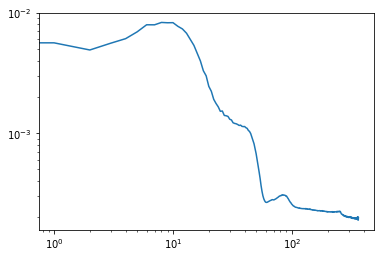

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021044 0.00017174 0.00021666 ... 0.00018936 0.00021666 0.00017174]
 [0.00019517 0.00019526 0.00019593 ... 0.00021368 0.00019642 0.00023147]
 [0.00016466 0.00019307 0.00019898 ... 0.00018231 0.0001944  0.00018976]
 ...
 [0.00017869 0.00020021 0.00020838 ... 0.0002098  0.00020308 0.00018768]
 [0.00016466 0.00018976 0.0001944  ... 0.00017267 0.00019898 0.00019307]
 [0.00019517 0.00023147 0.00019642 ... 0.00016683 0.00019593 0.00019526]]
el max de R es 362


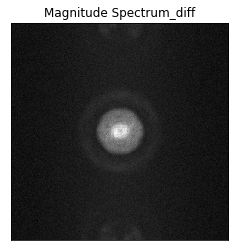

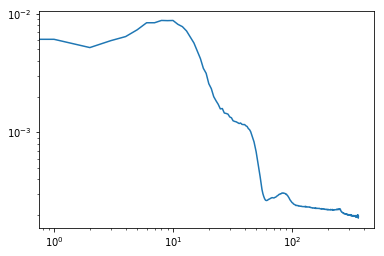

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022368 0.00018318 0.00021631 ... 0.00020493 0.00021631 0.00018318]
 [0.00018865 0.0001839  0.00019427 ... 0.0002243  0.00019169 0.0002448 ]
 [0.00015447 0.00021225 0.00019474 ... 0.0001929  0.00019014 0.00018411]
 ...
 [0.00021122 0.00019969 0.0002177  ... 0.00019288 0.00018027 0.0001943 ]
 [0.00015447 0.00018411 0.00019014 ... 0.00018443 0.00019474 0.00021225]
 [0.00018865 0.0002448  0.00019169 ... 0.00018128 0.00019427 0.0001839 ]]
el max de R es 362


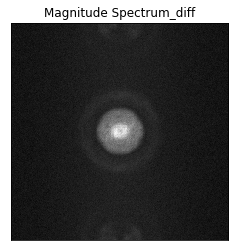

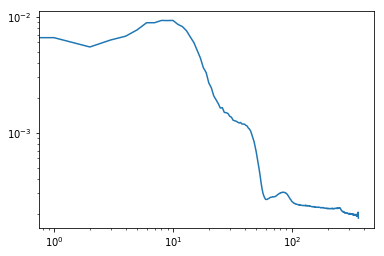

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021101 0.00018876 0.00020558 ... 0.00019083 0.00020558 0.00018876]
 [0.00019353 0.00018501 0.00019981 ... 0.00018362 0.00020184 0.00022531]
 [0.0001715  0.00020484 0.00020537 ... 0.0001863  0.0001764  0.00016003]
 ...
 [0.0001938  0.00018902 0.0001973  ... 0.0002123  0.00020315 0.00018525]
 [0.0001715  0.00016003 0.0001764  ... 0.00021555 0.00020537 0.00020484]
 [0.00019353 0.00022531 0.00020184 ... 0.00016554 0.00019981 0.00018501]]
el max de R es 362


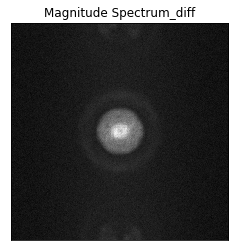

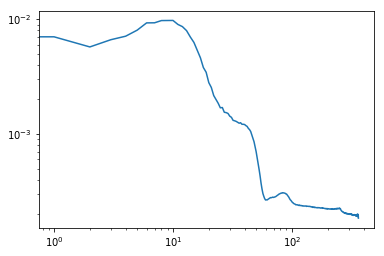

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00023256 0.00018    0.00021351 ... 0.00018246 0.00021351 0.00018   ]
 [0.00019927 0.00018688 0.00019867 ... 0.00021863 0.00020158 0.00022719]
 [0.00016756 0.00020018 0.00019869 ... 0.00018574 0.00019085 0.00018607]
 ...
 [0.0002078  0.00022102 0.0001978  ... 0.00020332 0.00019645 0.00018452]
 [0.00016756 0.00018607 0.00019085 ... 0.00018926 0.00019869 0.00020018]
 [0.00019927 0.00022719 0.00020158 ... 0.00016828 0.00019867 0.00018688]]
el max de R es 362


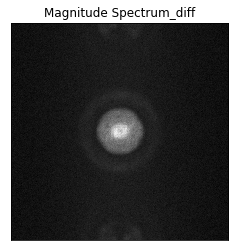

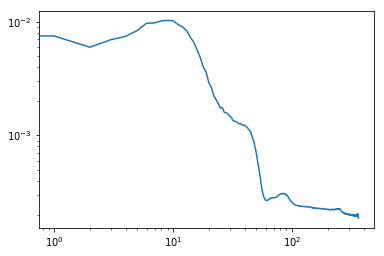

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019502 0.0001947  0.00020937 ... 0.00020721 0.00020937 0.0001947 ]
 [0.00018373 0.00019925 0.00020481 ... 0.00019975 0.00019657 0.00021718]
 [0.0001566  0.00019326 0.000192   ... 0.00017824 0.00019969 0.00017189]
 ...
 [0.00018833 0.00020203 0.00018884 ... 0.00020878 0.00019448 0.00019965]
 [0.0001566  0.00017189 0.00019969 ... 0.00019482 0.000192   0.00019326]
 [0.00018373 0.00021718 0.00019657 ... 0.00017163 0.00020481 0.00019925]]
el max de R es 362


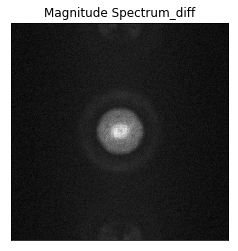

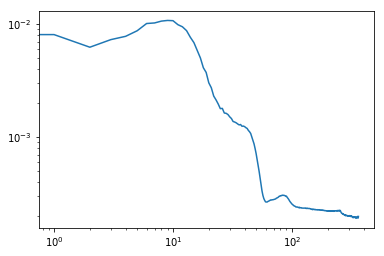

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021085 0.00018457 0.00021333 ... 0.00018429 0.00021333 0.00018457]
 [0.00017239 0.00017307 0.0002049  ... 0.00019297 0.00019533 0.00024598]
 [0.00017059 0.00020869 0.0002084  ... 0.00017116 0.00018463 0.00018323]
 ...
 [0.00018238 0.00021713 0.00020151 ... 0.00020713 0.00017731 0.00018616]
 [0.00017059 0.00018323 0.00018463 ... 0.00019182 0.0002084  0.00020869]
 [0.00017239 0.00024598 0.00019533 ... 0.00018464 0.0002049  0.00017307]]
el max de R es 362


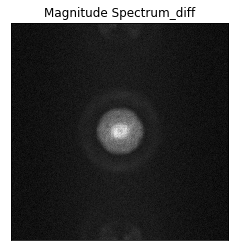

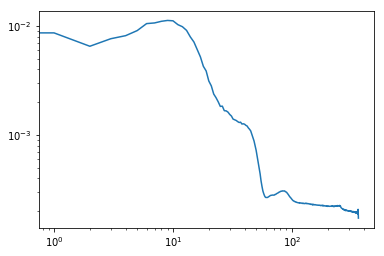

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021896 0.00018291 0.00021275 ... 0.00019634 0.00021275 0.00018291]
 [0.00019614 0.00019474 0.00020556 ... 0.00021243 0.00018403 0.00021716]
 [0.00016406 0.00019778 0.00019229 ... 0.00019    0.00020749 0.0001877 ]
 ...
 [0.00019815 0.0001954  0.00021928 ... 0.00021055 0.00018202 0.00019104]
 [0.00016406 0.0001877  0.00020749 ... 0.000192   0.00019229 0.00019778]
 [0.00019614 0.00021716 0.00018403 ... 0.00017701 0.00020556 0.00019474]]
el max de R es 362


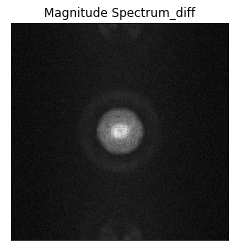

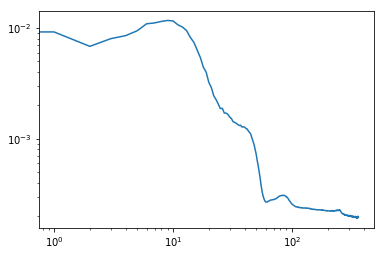

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002172  0.00018126 0.00020122 ... 0.00020205 0.00020122 0.00018126]
 [0.00019477 0.00019114 0.00020687 ... 0.00019995 0.00020732 0.00024139]
 [0.00015506 0.00020495 0.00020133 ... 0.00016676 0.00018116 0.00017843]
 ...
 [0.00018448 0.00021002 0.00019912 ... 0.00020553 0.00019754 0.00020236]
 [0.00015506 0.00017843 0.00018116 ... 0.00018041 0.00020133 0.00020495]
 [0.00019477 0.00024139 0.00020732 ... 0.00017533 0.00020687 0.00019114]]
el max de R es 362


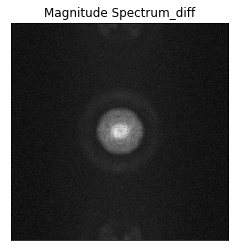

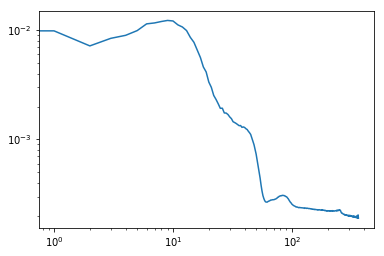

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020524 0.00017905 0.00021388 ... 0.00019625 0.00021388 0.00017905]
 [0.00019677 0.00017983 0.00018747 ... 0.00019856 0.00021052 0.00021407]
 [0.00016533 0.00020218 0.00019778 ... 0.00018757 0.00018544 0.00017755]
 ...
 [0.00019157 0.00020268 0.00019546 ... 0.00020457 0.00019209 0.00019002]
 [0.00016533 0.00017755 0.00018544 ... 0.00020298 0.00019778 0.00020218]
 [0.00019677 0.00021407 0.00021052 ... 0.00018327 0.00018747 0.00017983]]
el max de R es 362


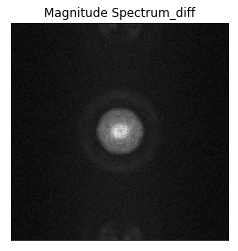

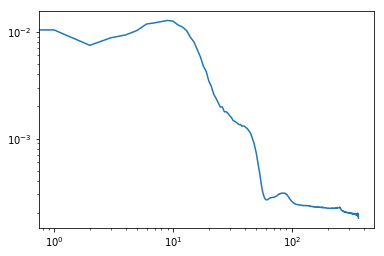

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001947  0.00017383 0.00020647 ... 0.00021471 0.00020647 0.00017383]
 [0.00019531 0.00018552 0.00020107 ... 0.0002058  0.00021339 0.00024126]
 [0.0001683  0.00019383 0.00020106 ... 0.00021004 0.00018912 0.00018357]
 ...
 [0.00018671 0.00019532 0.00019527 ... 0.00019776 0.00020417 0.00017   ]
 [0.0001683  0.00018357 0.00018912 ... 0.00019354 0.00020106 0.00019383]
 [0.00019531 0.00024126 0.00021339 ... 0.0001782  0.00020107 0.00018552]]
el max de R es 362


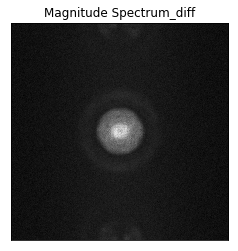

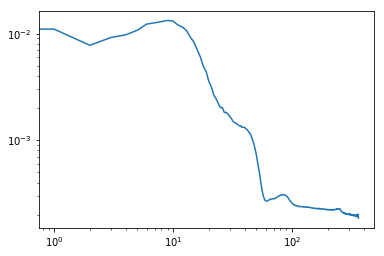

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020899 0.00018684 0.00018858 ... 0.0002063  0.00018858 0.00018684]
 [0.0001938  0.0001973  0.00020176 ... 0.00019368 0.00021023 0.0002282 ]
 [0.00015725 0.00021011 0.00020155 ... 0.0001759  0.00018397 0.00019451]
 ...
 [0.00019186 0.00022916 0.00020795 ... 0.00019955 0.00022002 0.0001997 ]
 [0.00015725 0.00019451 0.00018397 ... 0.00019003 0.00020155 0.00021011]
 [0.0001938  0.0002282  0.00021023 ... 0.00020248 0.00020176 0.0001973 ]]
el max de R es 362


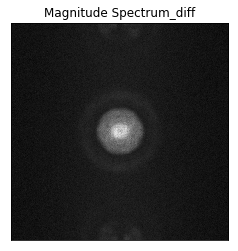

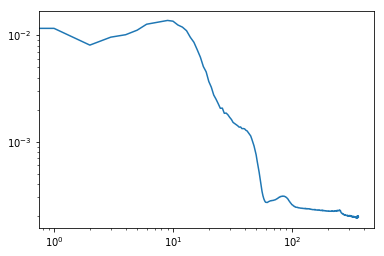

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020219 0.0001792  0.00020769 ... 0.00020272 0.00020769 0.0001792 ]
 [0.00021006 0.00020333 0.00019675 ... 0.00020467 0.00020535 0.00023618]
 [0.00017053 0.00019576 0.00020325 ... 0.0001827  0.00020226 0.00016619]
 ...
 [0.00019763 0.00021035 0.00021008 ... 0.00020978 0.00019115 0.00018906]
 [0.00017053 0.00016619 0.00020226 ... 0.00020309 0.00020325 0.00019576]
 [0.00021006 0.00023618 0.00020535 ... 0.00018232 0.00019675 0.00020333]]
el max de R es 362


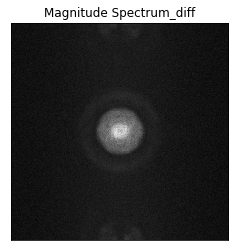

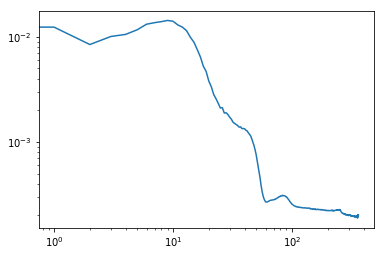

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022868 0.00018242 0.00021208 ... 0.0001993  0.00021208 0.00018242]
 [0.00019634 0.00018634 0.0001992  ... 0.00021534 0.00019301 0.00022588]
 [0.00015977 0.00019655 0.00018202 ... 0.00017218 0.00018761 0.00019215]
 ...
 [0.00019071 0.00023466 0.00019949 ... 0.00020909 0.00019748 0.00018855]
 [0.00015977 0.00019215 0.00018761 ... 0.00018875 0.00018202 0.00019655]
 [0.00019634 0.00022588 0.00019301 ... 0.0001732  0.0001992  0.00018634]]
el max de R es 362


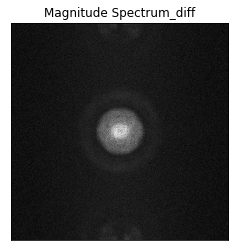

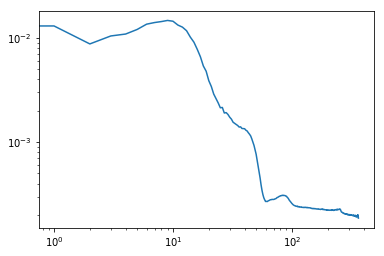

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018649 0.00017128 0.00021068 ... 0.00019685 0.00021068 0.00017128]
 [0.00018616 0.00018741 0.00019307 ... 0.0002004  0.00020568 0.00022258]
 [0.00017312 0.00019544 0.00020054 ... 0.00017242 0.00019905 0.00016565]
 ...
 [0.00019503 0.00020415 0.00019454 ... 0.00020533 0.00020244 0.00019464]
 [0.00017312 0.00016565 0.00019905 ... 0.00018447 0.00020054 0.00019544]
 [0.00018616 0.00022258 0.00020568 ... 0.00016988 0.00019307 0.00018741]]
el max de R es 362


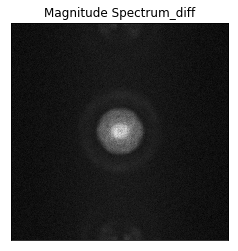

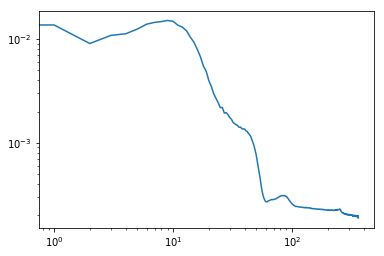

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00023812 0.00016254 0.00020587 ... 0.00020362 0.00020587 0.00016254]
 [0.00020194 0.00020727 0.00018055 ... 0.00021473 0.00020465 0.00020652]
 [0.00015772 0.00020813 0.00018355 ... 0.00018771 0.00018875 0.00017277]
 ...
 [0.0001742  0.00022219 0.00020188 ... 0.00020815 0.00019194 0.00019965]
 [0.00015772 0.00017277 0.00018875 ... 0.00021376 0.00018355 0.00020813]
 [0.00020194 0.00020652 0.00020465 ... 0.00017031 0.00018055 0.00020727]]
el max de R es 362


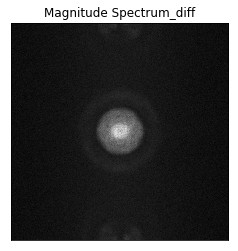

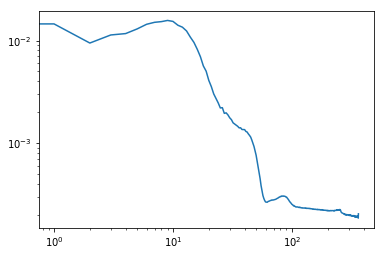

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018915 0.00019664 0.00020425 ... 0.00019332 0.00020425 0.00019664]
 [0.00019975 0.00018851 0.00020115 ... 0.00020402 0.00019509 0.00023045]
 [0.00015961 0.00019373 0.00020291 ... 0.00018644 0.00019063 0.00017379]
 ...
 [0.00019581 0.00021367 0.00020266 ... 0.00021077 0.00019451 0.00019035]
 [0.00015961 0.00017379 0.00019063 ... 0.00018434 0.00020291 0.00019373]
 [0.00019975 0.00023045 0.00019509 ... 0.00019153 0.00020115 0.00018851]]
el max de R es 362


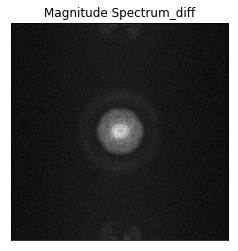

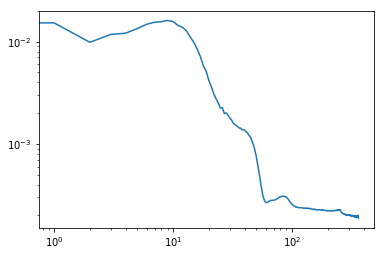

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019623 0.00018391 0.0002227  ... 0.00019647 0.0002227  0.00018391]
 [0.00019194 0.00019923 0.00020815 ... 0.00019773 0.00020054 0.00023364]
 [0.00016918 0.00019935 0.00018851 ... 0.00018262 0.00018042 0.00018411]
 ...
 [0.0002102  0.00021383 0.00021261 ... 0.00021451 0.00021451 0.00017181]
 [0.00016918 0.00018411 0.00018042 ... 0.00019403 0.00018851 0.00019935]
 [0.00019194 0.00023364 0.00020054 ... 0.00018261 0.00020815 0.00019923]]
el max de R es 362


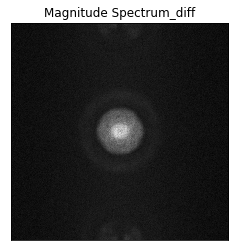

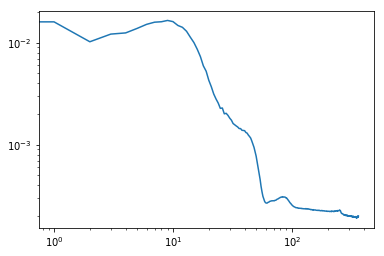

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022141 0.00018564 0.00021639 ... 0.00018757 0.00021639 0.00018564]
 [0.00020064 0.00019371 0.00019185 ... 0.00021192 0.00019424 0.00023717]
 [0.00017109 0.00019338 0.000204   ... 0.00019031 0.00019094 0.00017717]
 ...
 [0.00018377 0.00020612 0.00019748 ... 0.0002068  0.00020328 0.00018138]
 [0.00017109 0.00017717 0.00019094 ... 0.00020333 0.000204   0.00019338]
 [0.00020064 0.00023717 0.00019424 ... 0.00019279 0.00019185 0.00019371]]
el max de R es 362


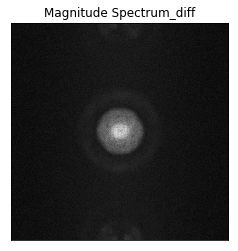

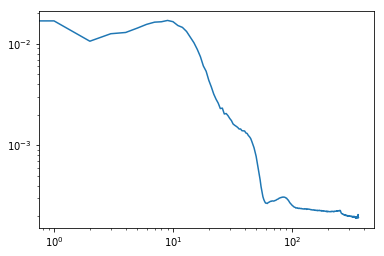

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021121 0.00018509 0.00021289 ... 0.00020053 0.00021289 0.00018509]
 [0.00017788 0.0001969  0.0001775  ... 0.00019372 0.00020759 0.00020939]
 [0.00016579 0.00019353 0.00021777 ... 0.00017925 0.00019466 0.0001709 ]
 ...
 [0.00017734 0.00021722 0.00019262 ... 0.00022287 0.00021087 0.00019746]
 [0.00016579 0.0001709  0.00019466 ... 0.00019658 0.00021777 0.00019353]
 [0.00017788 0.00020939 0.00020759 ... 0.00018894 0.0001775  0.0001969 ]]
el max de R es 362


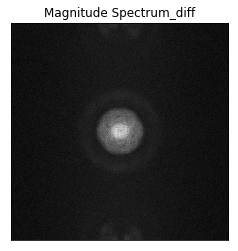

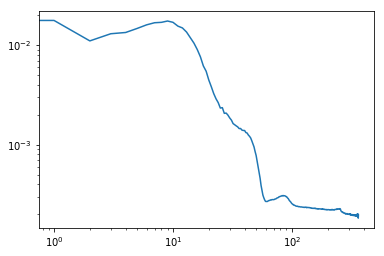

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022797 0.00018164 0.00021837 ... 0.0002033  0.00021837 0.00018164]
 [0.0001814  0.00018578 0.00020817 ... 0.00018941 0.00021059 0.00022521]
 [0.00015447 0.00019051 0.00019847 ... 0.00018175 0.00018977 0.00017752]
 ...
 [0.00019099 0.00020256 0.00020105 ... 0.00020731 0.00020283 0.00019345]
 [0.00015447 0.00017752 0.00018977 ... 0.00019629 0.00019847 0.00019051]
 [0.0001814  0.00022521 0.00021059 ... 0.00017693 0.00020817 0.00018578]]
el max de R es 362


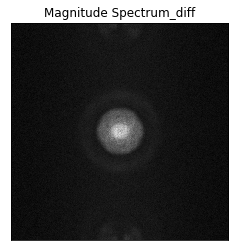

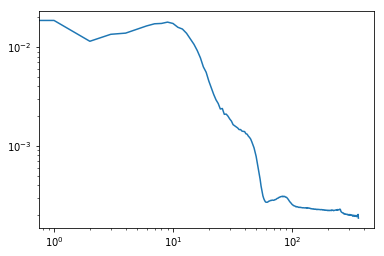

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020566 0.00019934 0.00019746 ... 0.00018441 0.00019746 0.00019934]
 [0.00018897 0.00019224 0.00021012 ... 0.00020355 0.00020909 0.00022028]
 [0.00016009 0.00021728 0.00019423 ... 0.00017539 0.00019427 0.00017356]
 ...
 [0.00020165 0.00021778 0.00019757 ... 0.00019141 0.00019004 0.00017615]
 [0.00016009 0.00017356 0.00019427 ... 0.00019359 0.00019423 0.00021728]
 [0.00018897 0.00022028 0.00020909 ... 0.00016647 0.00021012 0.00019224]]
el max de R es 362


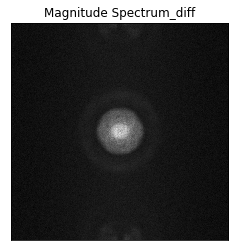

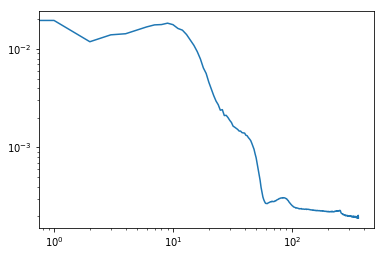

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002149  0.00018787 0.00021416 ... 0.00019529 0.00021416 0.00018787]
 [0.00019842 0.00019533 0.00018938 ... 0.00017925 0.00021275 0.00022681]
 [0.0001614  0.00019296 0.00020593 ... 0.00018433 0.0001729  0.0001657 ]
 ...
 [0.00021892 0.00020653 0.0002223  ... 0.00020444 0.00018761 0.00019177]
 [0.0001614  0.0001657  0.0001729  ... 0.00020445 0.00020593 0.00019296]
 [0.00019842 0.00022681 0.00021275 ... 0.00018336 0.00018938 0.00019533]]
el max de R es 362


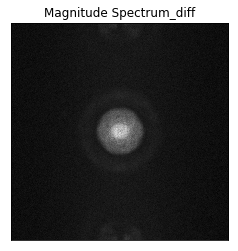

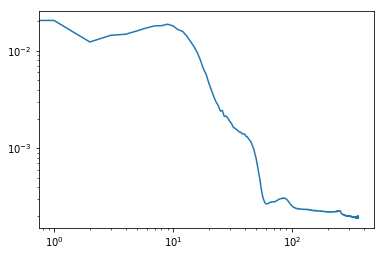

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020451 0.00019057 0.00019918 ... 0.00019329 0.00019918 0.00019057]
 [0.00018983 0.0001886  0.00019292 ... 0.00019605 0.00017799 0.00022659]
 [0.00017189 0.00017282 0.00018375 ... 0.0001817  0.00019614 0.00016672]
 ...
 [0.00018178 0.00019971 0.00019194 ... 0.00020774 0.00019281 0.00019443]
 [0.00017189 0.00016672 0.00019614 ... 0.00019293 0.00018375 0.00017282]
 [0.00018983 0.00022659 0.00017799 ... 0.00017769 0.00019292 0.0001886 ]]
el max de R es 362


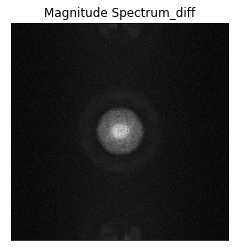

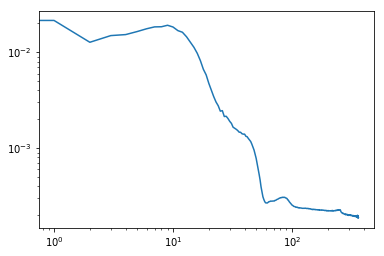

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021497 0.00018452 0.00021662 ... 0.00020144 0.00021662 0.00018452]
 [0.00020073 0.00018798 0.00020634 ... 0.000211   0.00021771 0.00021218]
 [0.00017308 0.00019797 0.00020759 ... 0.00019515 0.00018935 0.00016846]
 ...
 [0.00019242 0.00021325 0.00020943 ... 0.0002092  0.00020252 0.00017933]
 [0.00017308 0.00016846 0.00018935 ... 0.00018523 0.00020759 0.00019797]
 [0.00020073 0.00021218 0.00021771 ... 0.0001714  0.00020634 0.00018798]]
el max de R es 362


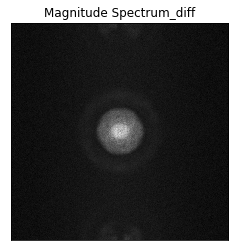

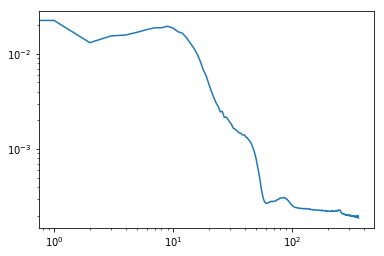

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022715 0.00019373 0.00020224 ... 0.00020271 0.00020224 0.00019373]
 [0.00017725 0.00017869 0.00019615 ... 0.00018768 0.00019252 0.00022869]
 [0.00016332 0.00021146 0.00019271 ... 0.00018313 0.00017775 0.00018868]
 ...
 [0.00018435 0.00017433 0.00019158 ... 0.00021484 0.0001985  0.00020488]
 [0.00016332 0.00018868 0.00017775 ... 0.00020033 0.00019271 0.00021146]
 [0.00017725 0.00022869 0.00019252 ... 0.00019655 0.00019615 0.00017869]]
el max de R es 362


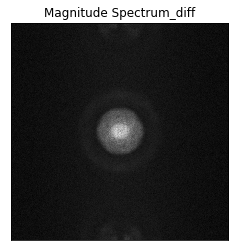

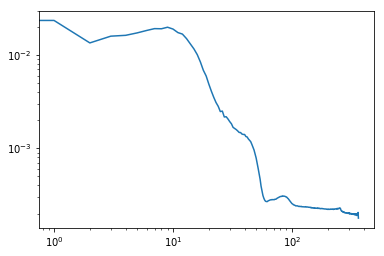

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022651 0.00019087 0.00020952 ... 0.00018686 0.00020952 0.00019087]
 [0.00019012 0.00017995 0.00020306 ... 0.00019776 0.00019801 0.00021535]
 [0.00016177 0.00019682 0.00020084 ... 0.00017192 0.00019679 0.00018155]
 ...
 [0.00019263 0.00021287 0.00021854 ... 0.00021091 0.00018654 0.00019503]
 [0.00016177 0.00018155 0.00019679 ... 0.00018925 0.00020084 0.00019682]
 [0.00019012 0.00021535 0.00019801 ... 0.00018349 0.00020306 0.00017995]]
el max de R es 362


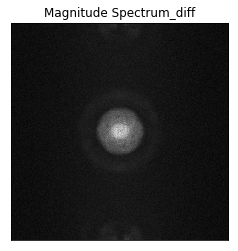

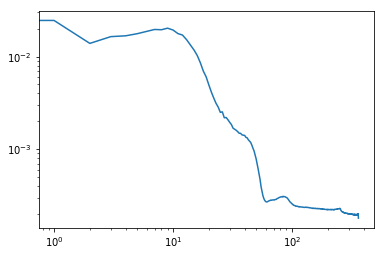

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018704 0.00018545 0.00021124 ... 0.00018088 0.00021124 0.00018545]
 [0.00018754 0.0002031  0.00019579 ... 0.00019828 0.00020764 0.00024563]
 [0.00016938 0.00019803 0.00019329 ... 0.00017204 0.00018258 0.00018397]
 ...
 [0.0001943  0.00020161 0.00019925 ... 0.00022449 0.00019155 0.00018058]
 [0.00016938 0.00018397 0.00018258 ... 0.00018782 0.00019329 0.00019803]
 [0.00018754 0.00024563 0.00020764 ... 0.00018191 0.00019579 0.0002031 ]]
el max de R es 362


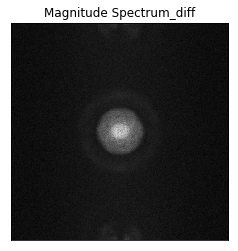

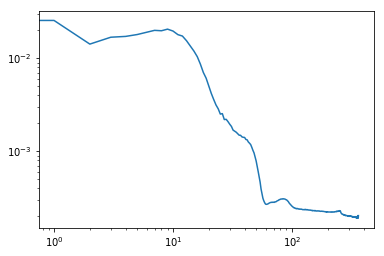

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020846 0.0001932  0.00020501 ... 0.00018513 0.00020501 0.0001932 ]
 [0.00020145 0.00019275 0.00019053 ... 0.0002018  0.00020009 0.00022726]
 [0.00017206 0.00017825 0.00018793 ... 0.00018694 0.00019065 0.00018191]
 ...
 [0.00019227 0.00020285 0.00019704 ... 0.00020371 0.00018872 0.00018433]
 [0.00017206 0.00018191 0.00019065 ... 0.00021388 0.00018793 0.00017825]
 [0.00020145 0.00022726 0.00020009 ... 0.00019238 0.00019053 0.00019275]]
el max de R es 362


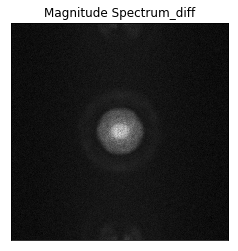

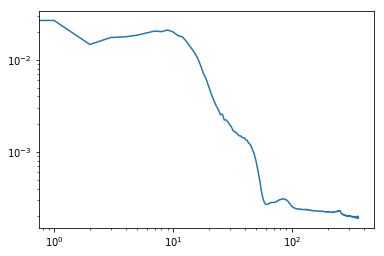

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019753 0.00020097 0.00019925 ... 0.00019688 0.00019925 0.00020097]
 [0.00019624 0.00017744 0.00017665 ... 0.00020407 0.00021924 0.00022503]
 [0.00017556 0.00018612 0.00021592 ... 0.00020481 0.00021566 0.00016828]
 ...
 [0.00018385 0.00020106 0.00021171 ... 0.00020581 0.00020433 0.00019624]
 [0.00017556 0.00016828 0.00021566 ... 0.0001925  0.00021592 0.00018612]
 [0.00019624 0.00022503 0.00021924 ... 0.00016128 0.00017665 0.00017744]]
el max de R es 362


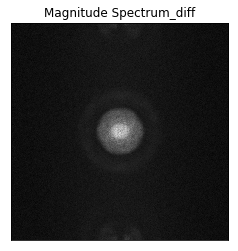

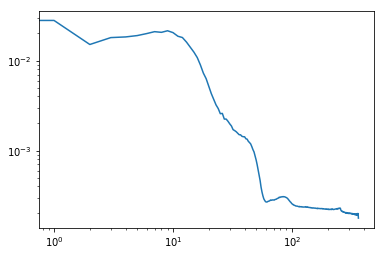

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019138 0.00019666 0.00020952 ... 0.00020231 0.00020952 0.00019666]
 [0.00018694 0.00019283 0.0001815  ... 0.00019518 0.00020657 0.00021306]
 [0.00015997 0.0002149  0.00020397 ... 0.00017989 0.00017815 0.00017234]
 ...
 [0.00019463 0.00021128 0.00020824 ... 0.00021569 0.00020572 0.00018655]
 [0.00015997 0.00017234 0.00017815 ... 0.00018474 0.00020397 0.0002149 ]
 [0.00018694 0.00021306 0.00020657 ... 0.00019794 0.0001815  0.00019283]]
el max de R es 362


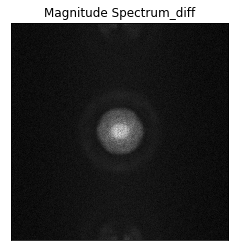

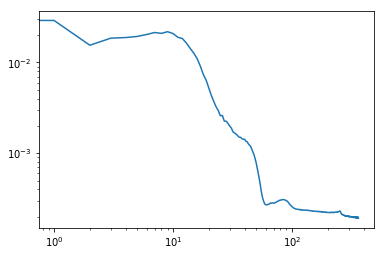

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021792 0.00018633 0.00021097 ... 0.00020041 0.00021097 0.00018633]
 [0.0001865  0.00018014 0.00020775 ... 0.00017697 0.00019667 0.00022917]
 [0.00017648 0.00020121 0.00021476 ... 0.00017487 0.00019666 0.00017142]
 ...
 [0.00020441 0.00020547 0.00020887 ... 0.00020851 0.00020712 0.0001925 ]
 [0.00017648 0.00017142 0.00019666 ... 0.00021018 0.00021476 0.00020121]
 [0.0001865  0.00022917 0.00019667 ... 0.00018084 0.00020775 0.00018014]]
el max de R es 362


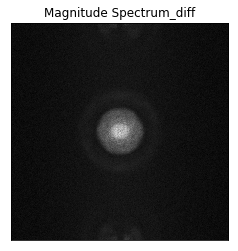

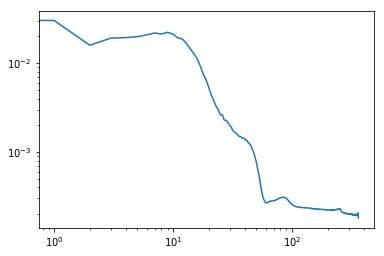

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021421 0.00020022 0.00023347 ... 0.00020729 0.00023347 0.00020022]
 [0.00019211 0.00016836 0.0001757  ... 0.0001907  0.0001909  0.00019562]
 [0.00015502 0.00020638 0.00021066 ... 0.00019563 0.00019481 0.00016752]
 ...
 [0.00019997 0.00021011 0.00020805 ... 0.00021403 0.00021831 0.00019731]
 [0.00015502 0.00016752 0.00019481 ... 0.00019823 0.00021066 0.00020638]
 [0.00019211 0.00019562 0.0001909  ... 0.00018322 0.0001757  0.00016836]]
el max de R es 362


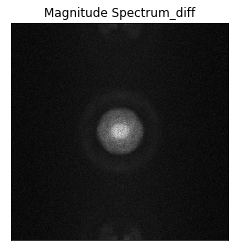

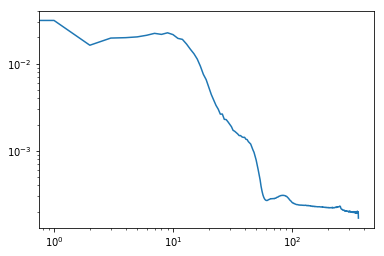

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019327 0.00018983 0.00020605 ... 0.00018502 0.00020605 0.00018983]
 [0.00020337 0.00019764 0.00019174 ... 0.00019417 0.00018181 0.00020392]
 [0.00016631 0.00019805 0.00019998 ... 0.00019751 0.00019412 0.00018342]
 ...
 [0.0001801  0.00019802 0.00018492 ... 0.00021813 0.00019488 0.00018242]
 [0.00016631 0.00018342 0.00019412 ... 0.00018577 0.00019998 0.00019805]
 [0.00020337 0.00020392 0.00018181 ... 0.00016736 0.00019174 0.00019764]]
el max de R es 362


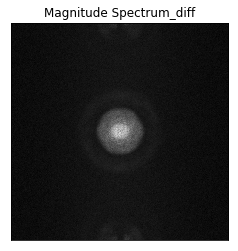

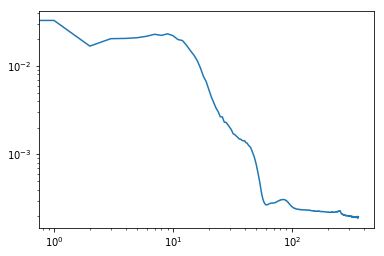

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020963 0.00019005 0.00020941 ... 0.00020007 0.00020941 0.00019005]
 [0.00020879 0.00017033 0.00019594 ... 0.00019541 0.0001925  0.00021462]
 [0.00016207 0.00019777 0.00019659 ... 0.00016977 0.00019054 0.0001897 ]
 ...
 [0.00018379 0.00020074 0.00023015 ... 0.00021295 0.00019147 0.00020107]
 [0.00016207 0.0001897  0.00019054 ... 0.0001963  0.00019659 0.00019777]
 [0.00020879 0.00021462 0.0001925  ... 0.00017889 0.00019594 0.00017033]]
el max de R es 362


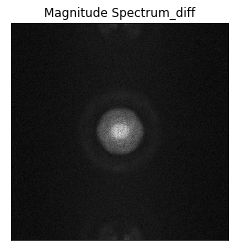

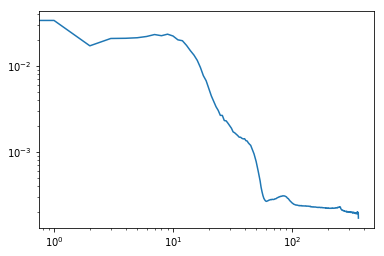

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020681 0.00016043 0.00020003 ... 0.00018563 0.00020003 0.00016043]
 [0.0001989  0.00019422 0.00019496 ... 0.00020916 0.00020237 0.00022609]
 [0.00015929 0.00020953 0.00021685 ... 0.00017653 0.00016832 0.00016395]
 ...
 [0.00021099 0.0002227  0.00021063 ... 0.00024801 0.00018504 0.00018428]
 [0.00015929 0.00016395 0.00016832 ... 0.00019909 0.00021685 0.00020953]
 [0.0001989  0.00022609 0.00020237 ... 0.00017227 0.00019496 0.00019422]]
el max de R es 362


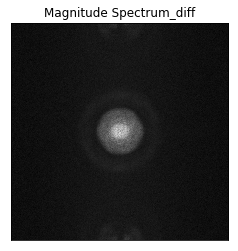

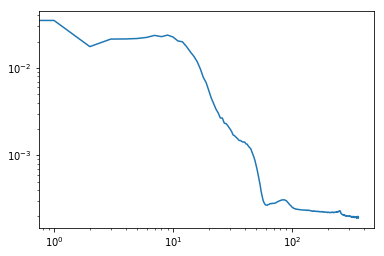

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021924 0.0001935  0.0002075  ... 0.00019901 0.0002075  0.0001935 ]
 [0.00018487 0.00020004 0.00020048 ... 0.00019181 0.00021375 0.00021681]
 [0.00015615 0.00019844 0.00020465 ... 0.000172   0.0001797  0.00016304]
 ...
 [0.00020167 0.00021797 0.00020078 ... 0.00021045 0.00018754 0.00020567]
 [0.00015615 0.00016304 0.0001797  ... 0.00020472 0.00020465 0.00019844]
 [0.00018487 0.00021681 0.00021375 ... 0.00017528 0.00020048 0.00020004]]
el max de R es 362


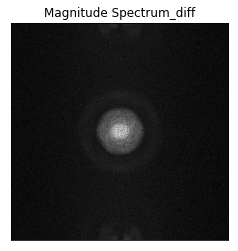

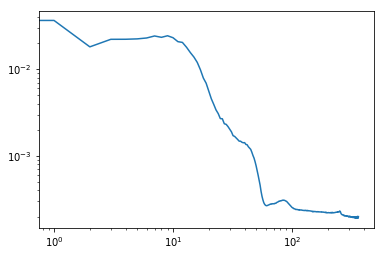

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020253 0.0001752  0.00020613 ... 0.00019426 0.00020613 0.0001752 ]
 [0.00019037 0.00019343 0.00020683 ... 0.00019274 0.00022027 0.0002376 ]
 [0.00014048 0.00019352 0.00020504 ... 0.00015932 0.00018815 0.00016318]
 ...
 [0.00019546 0.00021783 0.00021497 ... 0.0002088  0.00018948 0.0001948 ]
 [0.00014048 0.00016318 0.00018815 ... 0.00019421 0.00020504 0.00019352]
 [0.00019037 0.0002376  0.00022027 ... 0.00017423 0.00020683 0.00019343]]
el max de R es 362


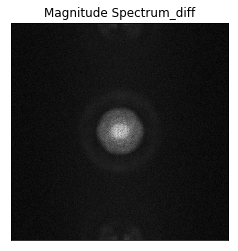

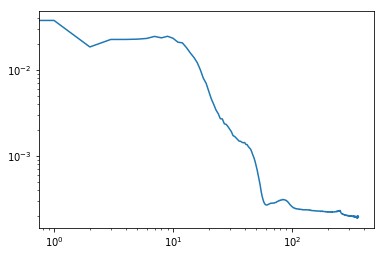

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020602 0.0001806  0.00020577 ... 0.00019768 0.00020577 0.0001806 ]
 [0.00019802 0.00018846 0.00019569 ... 0.00023143 0.00020968 0.00023956]
 [0.00016964 0.00018855 0.00020743 ... 0.000193   0.00019321 0.00017129]
 ...
 [0.00019412 0.00020796 0.00020868 ... 0.0002108  0.00019227 0.00019676]
 [0.00016964 0.00017129 0.00019321 ... 0.00018039 0.00020743 0.00018855]
 [0.00019802 0.00023956 0.00020968 ... 0.00018905 0.00019569 0.00018846]]
el max de R es 362


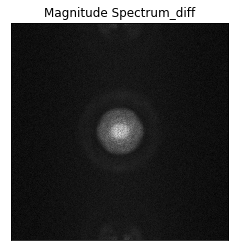

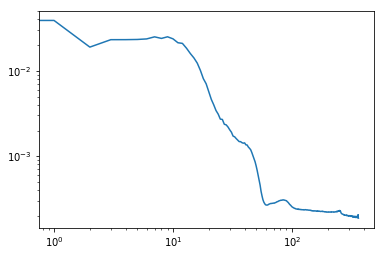

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00023046 0.00018453 0.00023284 ... 0.00018625 0.00023284 0.00018453]
 [0.00019939 0.00022228 0.00020809 ... 0.00019917 0.00021108 0.00021198]
 [0.00016642 0.00020704 0.00020419 ... 0.00018418 0.00018297 0.00018117]
 ...
 [0.00019272 0.00021897 0.00022236 ... 0.00021603 0.00018879 0.00019165]
 [0.00016642 0.00018117 0.00018297 ... 0.00019541 0.00020419 0.00020704]
 [0.00019939 0.00021198 0.00021108 ... 0.00018155 0.00020809 0.00022228]]
el max de R es 362


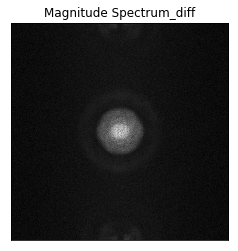

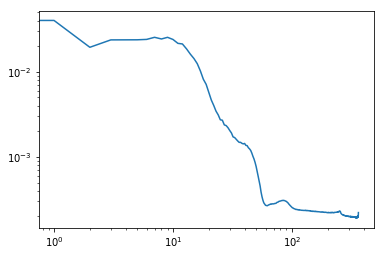

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019694 0.00019538 0.00020423 ... 0.00020589 0.00020423 0.00019538]
 [0.00019618 0.00018992 0.00020935 ... 0.00019812 0.00020126 0.00020891]
 [0.00016369 0.00019966 0.00018934 ... 0.00018241 0.00016746 0.00017132]
 ...
 [0.00020612 0.00021066 0.00019239 ... 0.00020913 0.0002027  0.00018564]
 [0.00016369 0.00017132 0.00016746 ... 0.00019836 0.00018934 0.00019966]
 [0.00019618 0.00020891 0.00020126 ... 0.00019095 0.00020935 0.00018992]]
el max de R es 362


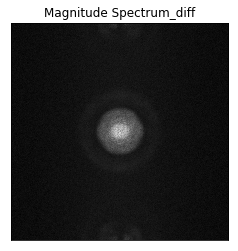

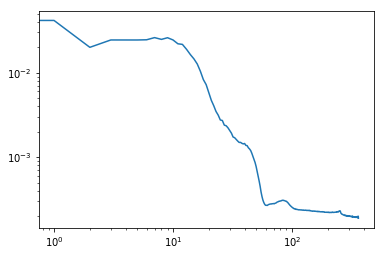

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019685 0.00019298 0.0002139  ... 0.00022257 0.0002139  0.00019298]
 [0.00018875 0.00019049 0.00018036 ... 0.00020794 0.00019096 0.00020415]
 [0.00014683 0.0001914  0.00020158 ... 0.00017395 0.00019207 0.00017088]
 ...
 [0.00019394 0.00022521 0.0002091  ... 0.00019352 0.00019414 0.00018625]
 [0.00014683 0.00017088 0.00019207 ... 0.00019279 0.00020158 0.0001914 ]
 [0.00018875 0.00020415 0.00019096 ... 0.00016746 0.00018036 0.00019049]]
el max de R es 362


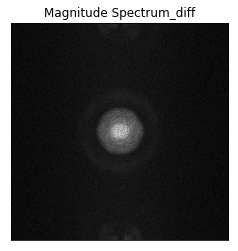

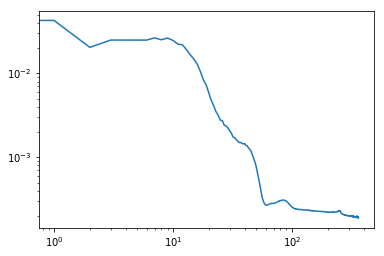

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00023354 0.00016892 0.00021525 ... 0.00021085 0.00021525 0.00016892]
 [0.00016098 0.000197   0.00019252 ... 0.00018326 0.00019029 0.00022458]
 [0.0001672  0.00020303 0.00020847 ... 0.00017061 0.00016605 0.00017428]
 ...
 [0.00019379 0.00021035 0.00018858 ... 0.00019853 0.00018172 0.00019209]
 [0.0001672  0.00017428 0.00016605 ... 0.00018347 0.00020847 0.00020303]
 [0.00016098 0.00022458 0.00019029 ... 0.00018008 0.00019252 0.000197  ]]
el max de R es 362


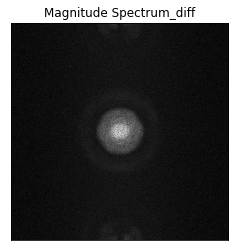

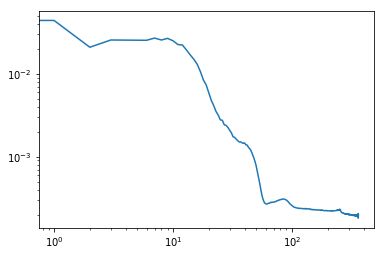

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020681 0.00017528 0.00020851 ... 0.00020118 0.00020851 0.00017528]
 [0.00020292 0.00019119 0.0002038  ... 0.00019428 0.00020493 0.00019402]
 [0.00016348 0.00019369 0.00022108 ... 0.00019795 0.00017407 0.0001853 ]
 ...
 [0.00019108 0.00023313 0.00019732 ... 0.00019777 0.00018904 0.00019677]
 [0.00016348 0.0001853  0.00017407 ... 0.00020398 0.00022108 0.00019369]
 [0.00020292 0.00019402 0.00020493 ... 0.0001806  0.0002038  0.00019119]]
el max de R es 362


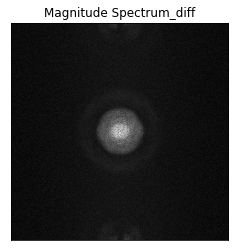

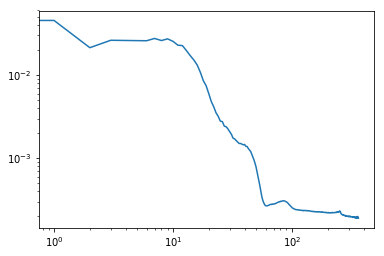

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018735 0.00018668 0.00019241 ... 0.00019538 0.00019241 0.00018668]
 [0.0001851  0.00017775 0.00017385 ... 0.00020652 0.00019715 0.00022608]
 [0.00017368 0.00020096 0.00021949 ... 0.00017723 0.00016628 0.0001689 ]
 ...
 [0.00020243 0.00019277 0.00021119 ... 0.00021224 0.00018882 0.00018448]
 [0.00017368 0.0001689  0.00016628 ... 0.00020808 0.00021949 0.00020096]
 [0.0001851  0.00022608 0.00019715 ... 0.00018196 0.00017385 0.00017775]]
el max de R es 362


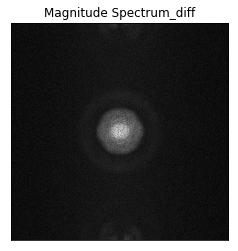

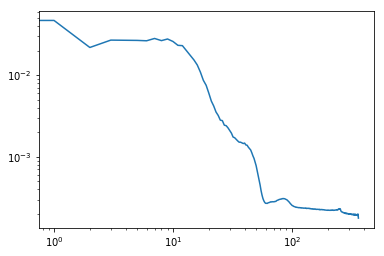

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021385 0.00019463 0.00021816 ... 0.00019164 0.00021816 0.00019463]
 [0.00018693 0.00019768 0.00018893 ... 0.00019884 0.00020048 0.00021436]
 [0.00014742 0.00019687 0.00021941 ... 0.00017845 0.00017621 0.00018197]
 ...
 [0.0001896  0.00021021 0.00020321 ... 0.00019481 0.00018872 0.00020554]
 [0.00014742 0.00018197 0.00017621 ... 0.00017942 0.00021941 0.00019687]
 [0.00018693 0.00021436 0.00020048 ... 0.00019365 0.00018893 0.00019768]]
el max de R es 362


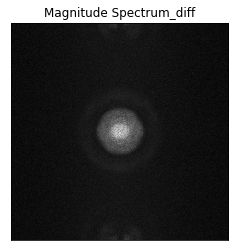

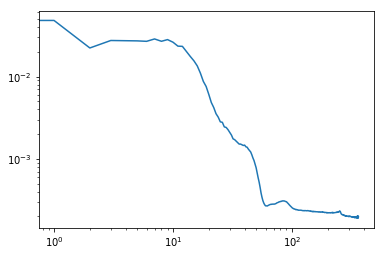

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020325 0.00018756 0.00021104 ... 0.00020544 0.00021104 0.00018756]
 [0.00019269 0.00019318 0.00019136 ... 0.00019348 0.00020127 0.00022622]
 [0.00016252 0.00020351 0.00019029 ... 0.00017442 0.00019681 0.00016884]
 ...
 [0.00019292 0.00019278 0.00022264 ... 0.00021301 0.00017613 0.00019784]
 [0.00016252 0.00016884 0.00019681 ... 0.00021269 0.00019029 0.00020351]
 [0.00019269 0.00022622 0.00020127 ... 0.00018625 0.00019136 0.00019318]]
el max de R es 362


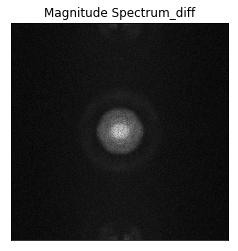

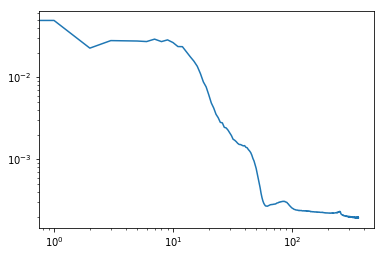

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00023312 0.00019771 0.00020173 ... 0.00020124 0.00020173 0.00019771]
 [0.00019074 0.00018483 0.00019845 ... 0.00019209 0.00020592 0.00021315]
 [0.00016974 0.0002     0.00019131 ... 0.00017404 0.00016263 0.00017507]
 ...
 [0.00019469 0.00020342 0.00019069 ... 0.00019299 0.00017718 0.00018372]
 [0.00016974 0.00017507 0.00016263 ... 0.00019917 0.00019131 0.0002    ]
 [0.00019074 0.00021315 0.00020592 ... 0.00017579 0.00019845 0.00018483]]
el max de R es 362


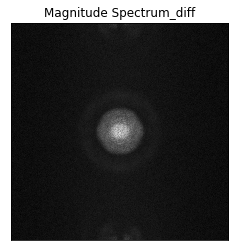

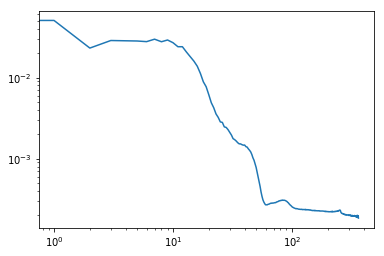

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021533 0.00020231 0.00022432 ... 0.00020558 0.00022432 0.00020231]
 [0.00020825 0.00018184 0.00019709 ... 0.00020508 0.00019759 0.00023338]
 [0.00016071 0.00020132 0.00019317 ... 0.00018035 0.00018324 0.0001775 ]
 ...
 [0.00018253 0.00020807 0.00019573 ... 0.00021152 0.00018714 0.00017329]
 [0.00016071 0.0001775  0.00018324 ... 0.0001896  0.00019317 0.00020132]
 [0.00020825 0.00023338 0.00019759 ... 0.00017166 0.00019709 0.00018184]]
el max de R es 362


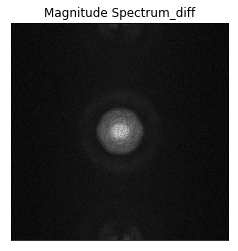

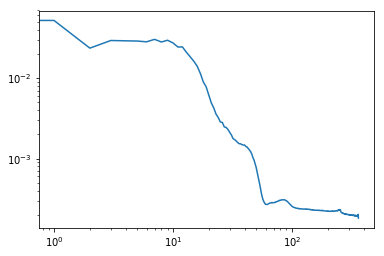

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019384 0.00018546 0.00020411 ... 0.0002011  0.00020411 0.00018546]
 [0.00020112 0.00019768 0.00020517 ... 0.00021604 0.00018954 0.00023699]
 [0.00015125 0.00019335 0.00021258 ... 0.00017844 0.00018464 0.0001518 ]
 ...
 [0.00018017 0.00018537 0.00021503 ... 0.00019881 0.00017403 0.00019665]
 [0.00015125 0.0001518  0.00018464 ... 0.00020627 0.00021258 0.00019335]
 [0.00020112 0.00023699 0.00018954 ... 0.00019197 0.00020517 0.00019768]]
el max de R es 362


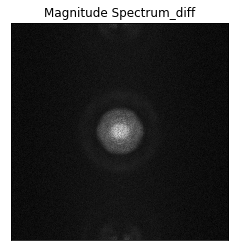

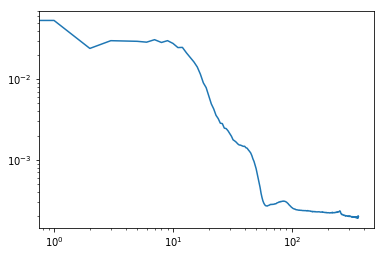

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020828 0.00018831 0.00020838 ... 0.00019988 0.00020838 0.00018831]
 [0.00018905 0.00018922 0.00020044 ... 0.00018034 0.00021045 0.0002054 ]
 [0.00017203 0.0001796  0.00020079 ... 0.00019158 0.00018405 0.00016982]
 ...
 [0.00020649 0.0002038  0.0002085  ... 0.00020834 0.00019626 0.00020029]
 [0.00017203 0.00016982 0.00018405 ... 0.00018735 0.00020079 0.0001796 ]
 [0.00018905 0.0002054  0.00021045 ... 0.00017819 0.00020044 0.00018922]]
el max de R es 362


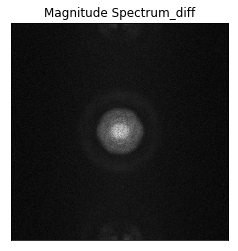

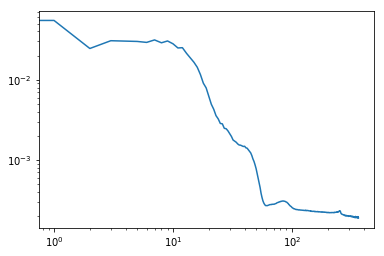

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021344 0.00019023 0.00020806 ... 0.00019714 0.00020806 0.00019023]
 [0.00019093 0.00019982 0.0001953  ... 0.00019468 0.00019439 0.00021869]
 [0.00016623 0.00022084 0.0002164  ... 0.00018298 0.00018767 0.00017969]
 ...
 [0.00020556 0.00020592 0.00020102 ... 0.00022406 0.00016453 0.00018454]
 [0.00016623 0.00017969 0.00018767 ... 0.00020728 0.0002164  0.00022084]
 [0.00019093 0.00021869 0.00019439 ... 0.00016287 0.0001953  0.00019982]]
el max de R es 362


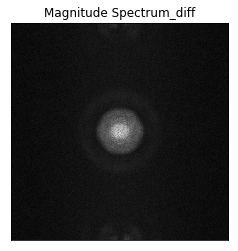

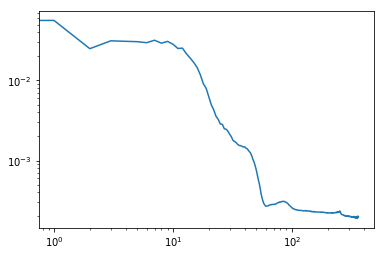

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021296 0.00018131 0.00022058 ... 0.00020492 0.00022058 0.00018131]
 [0.00021102 0.00017673 0.00018848 ... 0.00020124 0.0001863  0.00021437]
 [0.00017236 0.00018832 0.00019884 ... 0.00018547 0.00017118 0.00016162]
 ...
 [0.00018481 0.00022802 0.00020707 ... 0.00022099 0.00019289 0.00016978]
 [0.00017236 0.00016162 0.00017118 ... 0.0001856  0.00019884 0.00018832]
 [0.00021102 0.00021437 0.0001863  ... 0.00018457 0.00018848 0.00017673]]
el max de R es 362


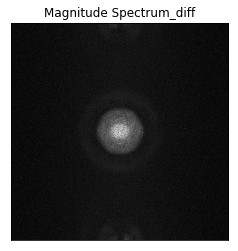

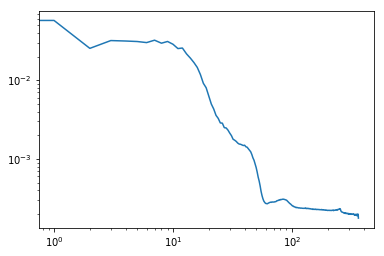

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020507 0.00019398 0.0002293  ... 0.00020193 0.0002293  0.00019398]
 [0.00018193 0.00018307 0.00020246 ... 0.00019315 0.00019032 0.00022756]
 [0.0001418  0.00020717 0.00020907 ... 0.0001732  0.00018758 0.00017191]
 ...
 [0.00017634 0.00020161 0.00018686 ... 0.000219   0.00018722 0.00018273]
 [0.0001418  0.00017191 0.00018758 ... 0.00019294 0.00020907 0.00020717]
 [0.00018193 0.00022756 0.00019032 ... 0.00018387 0.00020246 0.00018307]]
el max de R es 362


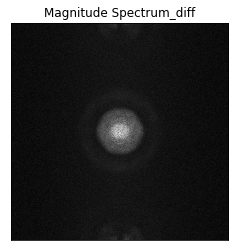

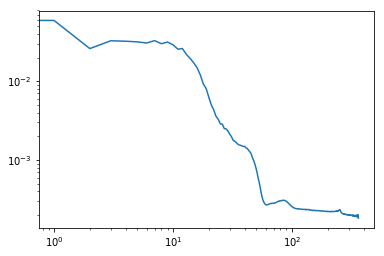

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020645 0.00020018 0.00020241 ... 0.00019018 0.00020241 0.00020018]
 [0.00021467 0.00020052 0.00020062 ... 0.00018409 0.00020179 0.00021365]
 [0.00017204 0.00019951 0.00019194 ... 0.00017864 0.00019736 0.00017497]
 ...
 [0.00018567 0.0002174  0.00021141 ... 0.00022131 0.00018724 0.00018321]
 [0.00017204 0.00017497 0.00019736 ... 0.00019591 0.00019194 0.00019951]
 [0.00021467 0.00021365 0.00020179 ... 0.00020427 0.00020062 0.00020052]]
el max de R es 362


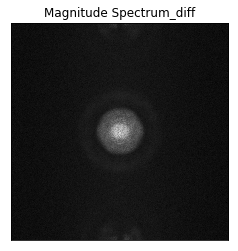

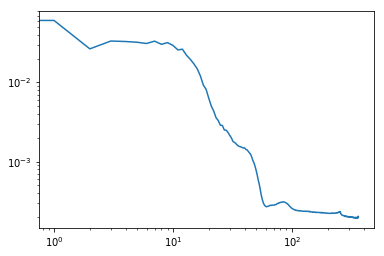

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019062 0.00019966 0.00021231 ... 0.00020081 0.00021231 0.00019966]
 [0.00021413 0.00018986 0.00019696 ... 0.00020448 0.00018822 0.00021838]
 [0.00015783 0.00020174 0.00021442 ... 0.00019315 0.00019599 0.00017648]
 ...
 [0.000199   0.00020191 0.00019916 ... 0.00021962 0.00018765 0.0001818 ]
 [0.00015783 0.00017648 0.00019599 ... 0.00018018 0.00021442 0.00020174]
 [0.00021413 0.00021838 0.00018822 ... 0.00018107 0.00019696 0.00018986]]
el max de R es 362


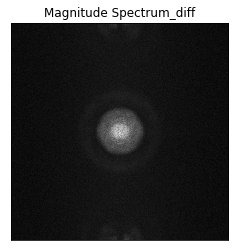

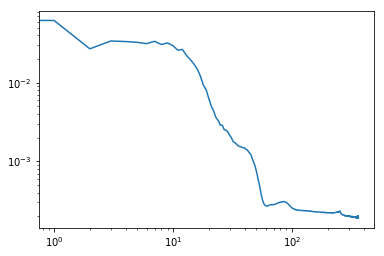

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021575 0.00020343 0.00023434 ... 0.0001896  0.00023434 0.00020343]
 [0.00017751 0.00017367 0.00018278 ... 0.00019692 0.00020563 0.00021693]
 [0.00017221 0.00021325 0.00019313 ... 0.00017821 0.00020529 0.00017695]
 ...
 [0.00018569 0.00022153 0.00020952 ... 0.00019221 0.00018041 0.00019862]
 [0.00017221 0.00017695 0.00020529 ... 0.00020857 0.00019313 0.00021325]
 [0.00017751 0.00021693 0.00020563 ... 0.00018362 0.00018278 0.00017367]]
el max de R es 362


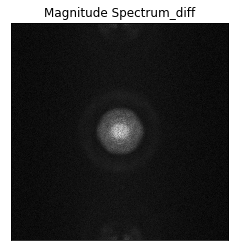

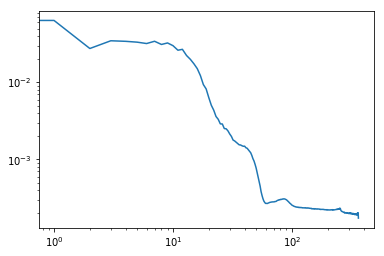

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002025  0.0001814  0.00021234 ... 0.00020336 0.00021234 0.0001814 ]
 [0.00018173 0.00019598 0.00019285 ... 0.00019628 0.00019069 0.00022226]
 [0.00016942 0.00020793 0.00020196 ... 0.00018409 0.00018296 0.00017752]
 ...
 [0.00019695 0.00021088 0.00021171 ... 0.00020433 0.00018708 0.00020069]
 [0.00016942 0.00017752 0.00018296 ... 0.00018862 0.00020196 0.00020793]
 [0.00018173 0.00022226 0.00019069 ... 0.00017414 0.00019285 0.00019598]]
el max de R es 362


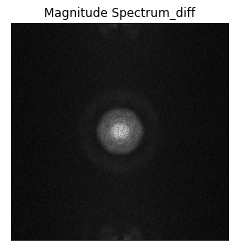

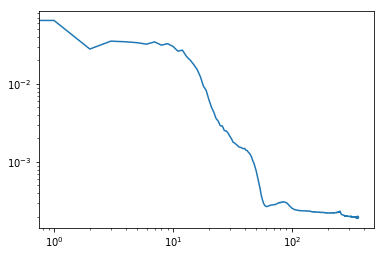

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0001857  0.00019127 0.00021076 ... 0.00018845 0.00021076 0.00019127]
 [0.0002035  0.00017351 0.00018391 ... 0.00022301 0.00021983 0.00021378]
 [0.0001776  0.00020084 0.00020691 ... 0.00018575 0.00018871 0.00016858]
 ...
 [0.00018277 0.00022253 0.00020844 ... 0.00019155 0.00018949 0.00018785]
 [0.0001776  0.00016858 0.00018871 ... 0.00020653 0.00020691 0.00020084]
 [0.0002035  0.00021378 0.00021983 ... 0.00019237 0.00018391 0.00017351]]
el max de R es 362


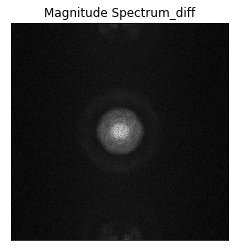

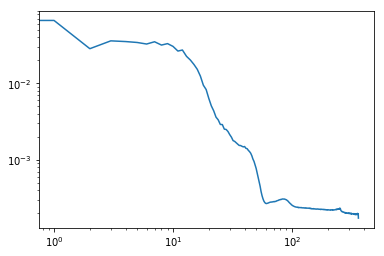

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020966 0.00018344 0.00024048 ... 0.00020652 0.00024048 0.00018344]
 [0.00019617 0.00018438 0.00017744 ... 0.00019836 0.00018913 0.00020325]
 [0.0001555  0.00019273 0.00020164 ... 0.00017263 0.00018249 0.00016392]
 ...
 [0.00021604 0.00022241 0.00021048 ... 0.00019255 0.00018458 0.00017694]
 [0.0001555  0.00016392 0.00018249 ... 0.00021121 0.00020164 0.00019273]
 [0.00019617 0.00020325 0.00018913 ... 0.00019382 0.00017744 0.00018438]]
el max de R es 362


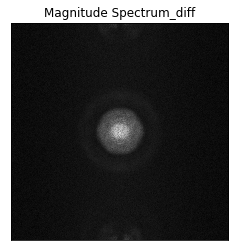

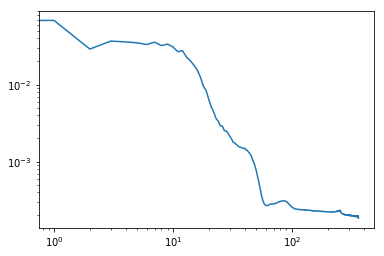

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018715 0.00019736 0.00020174 ... 0.00018186 0.00020174 0.00019736]
 [0.00020035 0.00019319 0.00019684 ... 0.00019644 0.00020188 0.00022669]
 [0.00017892 0.00019183 0.00020299 ... 0.00020725 0.00018884 0.00017856]
 ...
 [0.00019616 0.00021818 0.00020058 ... 0.00017555 0.00019494 0.00019615]
 [0.00017892 0.00017856 0.00018884 ... 0.00018325 0.00020299 0.00019183]
 [0.00020035 0.00022669 0.00020188 ... 0.00018422 0.00019684 0.00019319]]
el max de R es 362


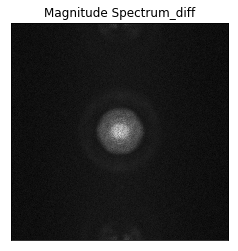

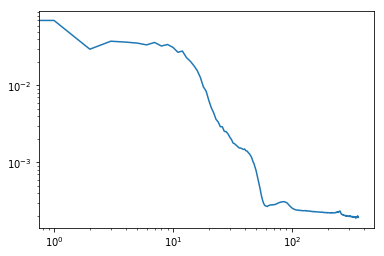

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002104  0.00018925 0.00021252 ... 0.00019244 0.00021252 0.00018925]
 [0.00018889 0.00019195 0.00019851 ... 0.00021528 0.00018651 0.00022714]
 [0.00016272 0.0002068  0.0002102  ... 0.00018883 0.0001967  0.0001774 ]
 ...
 [0.00019015 0.00020245 0.00020733 ... 0.00019915 0.00019715 0.00018312]
 [0.00016272 0.0001774  0.0001967  ... 0.00019753 0.0002102  0.0002068 ]
 [0.00018889 0.00022714 0.00018651 ... 0.00018199 0.00019851 0.00019195]]
el max de R es 362


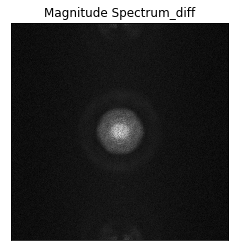

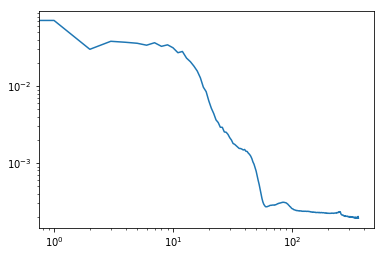

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021076 0.00019127 0.00021095 ... 0.0002114  0.00021095 0.00019127]
 [0.00019408 0.00020039 0.00018578 ... 0.00020082 0.00016624 0.00021151]
 [0.00016582 0.00020916 0.00020003 ... 0.00017721 0.00018253 0.00017533]
 ...
 [0.00017855 0.00020832 0.00020888 ... 0.00020607 0.00018635 0.00020809]
 [0.00016582 0.00017533 0.00018253 ... 0.00020625 0.00020003 0.00020916]
 [0.00019408 0.00021151 0.00016624 ... 0.00018261 0.00018578 0.00020039]]
el max de R es 362


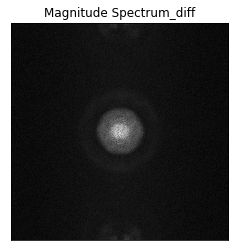

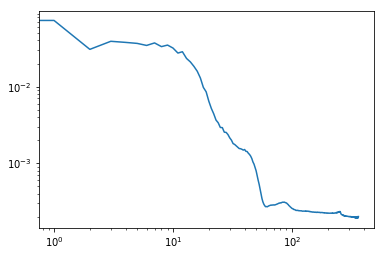

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019051 0.00018475 0.0002155  ... 0.00019275 0.0002155  0.00018475]
 [0.00021556 0.00021265 0.00020085 ... 0.00020719 0.00018664 0.00022236]
 [0.00016805 0.00020253 0.00018916 ... 0.00018876 0.00018648 0.00016519]
 ...
 [0.00019113 0.00019178 0.00021304 ... 0.00020433 0.00018247 0.00018796]
 [0.00016805 0.00016519 0.00018648 ... 0.00019136 0.00018916 0.00020253]
 [0.00021556 0.00022236 0.00018664 ... 0.00019977 0.00020085 0.00021265]]
el max de R es 362


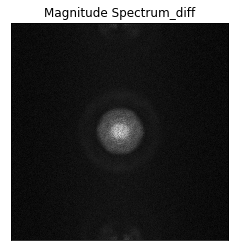

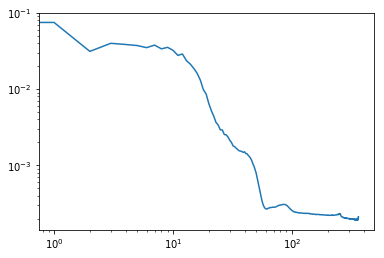

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022847 0.00018514 0.00019906 ... 0.00021435 0.00019906 0.00018514]
 [0.0001841  0.00020563 0.00020018 ... 0.00020607 0.00017905 0.00021754]
 [0.00016098 0.00021222 0.0001958  ... 0.00018683 0.00018559 0.00015392]
 ...
 [0.00021274 0.00021139 0.00020244 ... 0.00021154 0.00018625 0.00018657]
 [0.00016098 0.00015392 0.00018559 ... 0.00020419 0.0001958  0.00021222]
 [0.0001841  0.00021754 0.00017905 ... 0.00016327 0.00020018 0.00020563]]
el max de R es 362


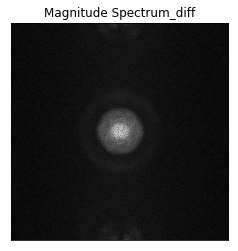

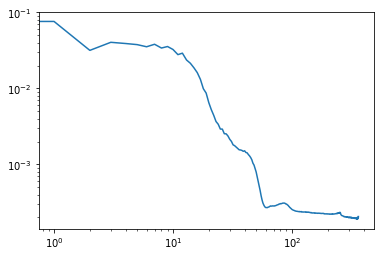

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00017587 0.00018448 0.00021128 ... 0.00018121 0.00021128 0.00018448]
 [0.00017686 0.00020176 0.00016852 ... 0.00019587 0.00019234 0.00020771]
 [0.00015549 0.00020005 0.0002128  ... 0.00019704 0.0001796  0.0001801 ]
 ...
 [0.00019546 0.00021192 0.00020422 ... 0.00020861 0.0001922  0.00018614]
 [0.00015549 0.0001801  0.0001796  ... 0.00018517 0.0002128  0.00020005]
 [0.00017686 0.00020771 0.00019234 ... 0.00018742 0.00016852 0.00020176]]
el max de R es 362


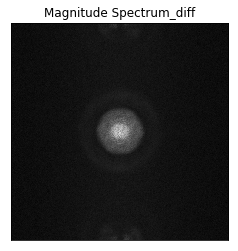

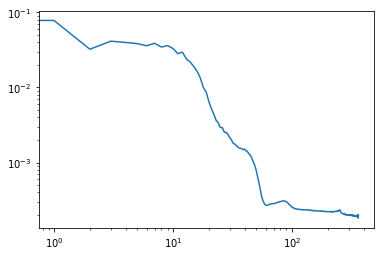

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020986 0.00018305 0.00019844 ... 0.0001934  0.00019844 0.00018305]
 [0.00020052 0.00019403 0.00021343 ... 0.00020252 0.000196   0.00020958]
 [0.00016326 0.00020623 0.00019049 ... 0.00018456 0.0001775  0.00015761]
 ...
 [0.00018431 0.00019238 0.0002057  ... 0.00019821 0.00019292 0.00019895]
 [0.00016326 0.00015761 0.0001775  ... 0.00020256 0.00019049 0.00020623]
 [0.00020052 0.00020958 0.000196   ... 0.0001849  0.00021343 0.00019403]]
el max de R es 362


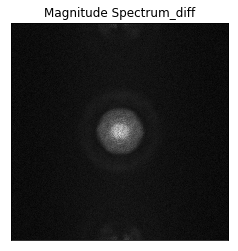

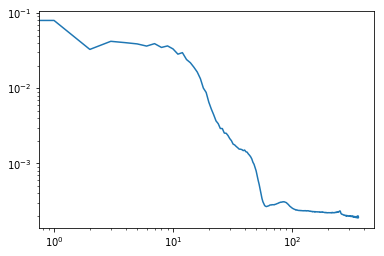

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021083 0.00017231 0.0002162  ... 0.00019251 0.0002162  0.00017231]
 [0.00020937 0.0001751  0.00021747 ... 0.0001868  0.00021517 0.00023556]
 [0.00016138 0.00021159 0.00019416 ... 0.00018352 0.00016882 0.0001631 ]
 ...
 [0.00018796 0.00019704 0.00019962 ... 0.00021218 0.00018957 0.00017537]
 [0.00016138 0.0001631  0.00016882 ... 0.00018613 0.00019416 0.00021159]
 [0.00020937 0.00023556 0.00021517 ... 0.00016355 0.00021747 0.0001751 ]]
el max de R es 362


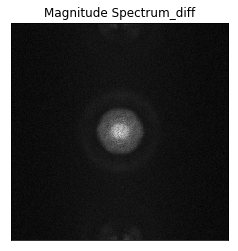

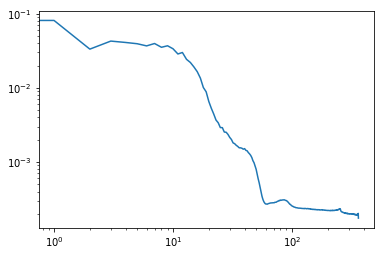

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020963 0.00018505 0.00019772 ... 0.00017775 0.00019772 0.00018505]
 [0.00023567 0.00020013 0.00020098 ... 0.00020364 0.00019683 0.00021627]
 [0.00015958 0.00019702 0.00020636 ... 0.00017412 0.00019252 0.00016966]
 ...
 [0.00018926 0.0002112  0.00019996 ... 0.00020412 0.00019669 0.00016088]
 [0.00015958 0.00016966 0.00019252 ... 0.00018611 0.00020636 0.00019702]
 [0.00023567 0.00021627 0.00019683 ... 0.00018825 0.00020098 0.00020013]]
el max de R es 362


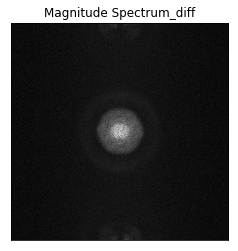

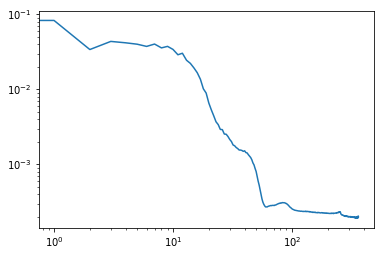

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021402 0.00019841 0.00020086 ... 0.00020888 0.00020086 0.00019841]
 [0.00019919 0.00018475 0.00021718 ... 0.00018917 0.00021134 0.00019748]
 [0.00016693 0.00021229 0.00018746 ... 0.00018041 0.00019361 0.00018273]
 ...
 [0.00020331 0.00020159 0.00023201 ... 0.00021156 0.00020682 0.00018752]
 [0.00016693 0.00018273 0.00019361 ... 0.00021114 0.00018746 0.00021229]
 [0.00019919 0.00019748 0.00021134 ... 0.00018378 0.00021718 0.00018475]]
el max de R es 362


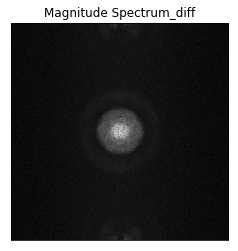

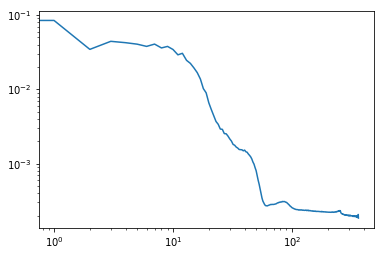

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020077 0.00019156 0.00021306 ... 0.00016855 0.00021306 0.00019156]
 [0.00018124 0.00019262 0.00021013 ... 0.00017402 0.00019619 0.00021707]
 [0.00015549 0.0002168  0.00019326 ... 0.00018114 0.00018683 0.00018827]
 ...
 [0.00018633 0.00019575 0.00020562 ... 0.00021501 0.00020023 0.0001863 ]
 [0.00015549 0.00018827 0.00018683 ... 0.00020819 0.00019326 0.0002168 ]
 [0.00018124 0.00021707 0.00019619 ... 0.00015313 0.00021013 0.00019262]]
el max de R es 362


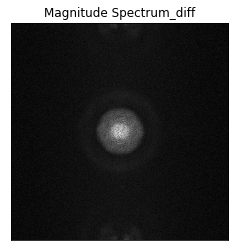

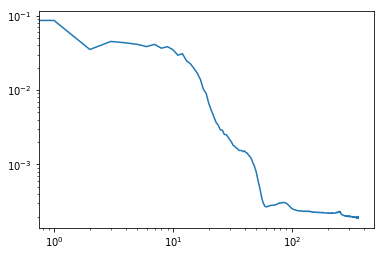

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019092 0.00017741 0.00020443 ... 0.00020408 0.00020443 0.00017741]
 [0.00019778 0.00019195 0.00022118 ... 0.00019821 0.00020075 0.00021929]
 [0.00015575 0.00018513 0.00019659 ... 0.00019694 0.00019188 0.00018239]
 ...
 [0.00018697 0.00019483 0.0002095  ... 0.00020741 0.00018655 0.00018384]
 [0.00015575 0.00018239 0.00019188 ... 0.0002159  0.00019659 0.00018513]
 [0.00019778 0.00021929 0.00020075 ... 0.00020559 0.00022118 0.00019195]]
el max de R es 362


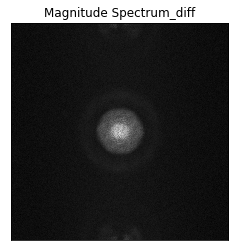

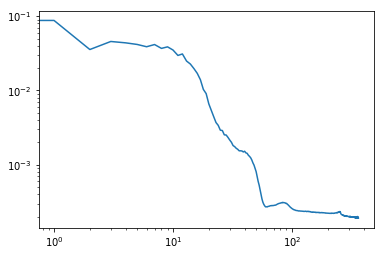

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021972 0.00019418 0.0002035  ... 0.00019854 0.0002035  0.00019418]
 [0.00020911 0.00020379 0.00020557 ... 0.00019548 0.00021289 0.00021577]
 [0.00016058 0.00020677 0.00022282 ... 0.00017491 0.00017583 0.0001772 ]
 ...
 [0.00020595 0.00017906 0.00021956 ... 0.00020785 0.00020687 0.00018248]
 [0.00016058 0.0001772  0.00017583 ... 0.00018089 0.00022282 0.00020677]
 [0.00020911 0.00021577 0.00021289 ... 0.00017538 0.00020557 0.00020379]]
el max de R es 362


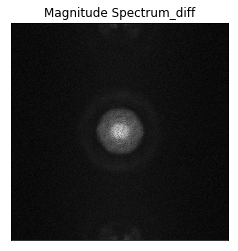

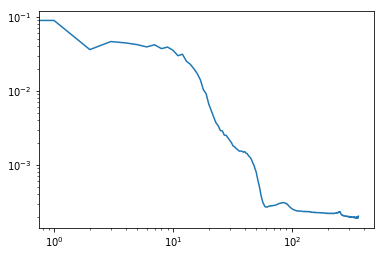

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00022442 0.00017693 0.00020587 ... 0.00020043 0.00020587 0.00017693]
 [0.00019794 0.00020993 0.00019283 ... 0.00019743 0.00019526 0.00021023]
 [0.0001737  0.0002074  0.00020625 ... 0.00019147 0.00019517 0.00017039]
 ...
 [0.00018424 0.00020697 0.00019897 ... 0.00020821 0.00017548 0.00018887]
 [0.0001737  0.00017039 0.00019517 ... 0.00020078 0.00020625 0.0002074 ]
 [0.00019794 0.00021023 0.00019526 ... 0.00018685 0.00019283 0.00020993]]
el max de R es 362


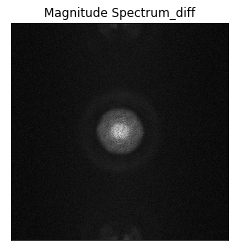

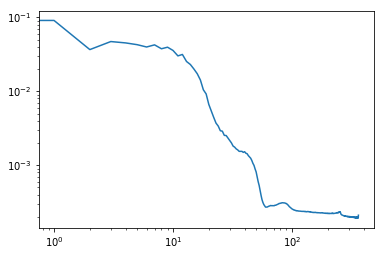

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00017742 0.00018497 0.00019617 ... 0.00020203 0.00019617 0.00018497]
 [0.00020907 0.00018507 0.00018665 ... 0.00020101 0.00018746 0.00023745]
 [0.00017065 0.00020547 0.00021838 ... 0.00017989 0.00018587 0.00019215]
 ...
 [0.00017145 0.00020916 0.00021139 ... 0.00022177 0.00018949 0.00017046]
 [0.00017065 0.00019215 0.00018587 ... 0.0002022  0.00021838 0.00020547]
 [0.00020907 0.00023745 0.00018746 ... 0.00017569 0.00018665 0.00018507]]
el max de R es 362


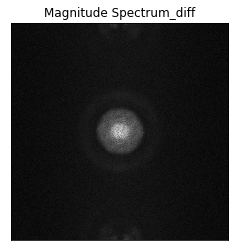

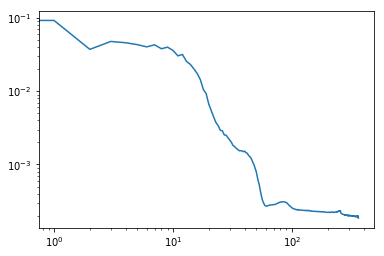

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021472 0.00017057 0.0002013  ... 0.00020124 0.0002013  0.00017057]
 [0.0001776  0.00018951 0.00019095 ... 0.00022598 0.00020003 0.00022641]
 [0.00016755 0.00020515 0.00021228 ... 0.00018831 0.00017901 0.00018062]
 ...
 [0.00019298 0.00021767 0.00019585 ... 0.00020917 0.00018801 0.00016433]
 [0.00016755 0.00018062 0.00017901 ... 0.00020509 0.00021228 0.00020515]
 [0.0001776  0.00022641 0.00020003 ... 0.00016507 0.00019095 0.00018951]]
el max de R es 362


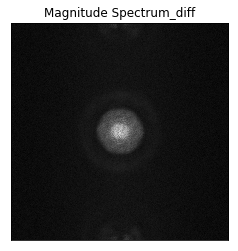

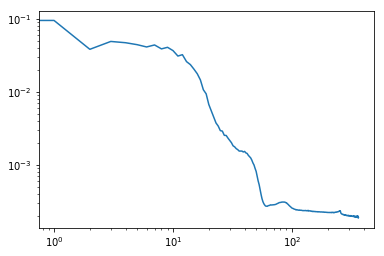

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020105 0.00019075 0.00021534 ... 0.00019943 0.00021534 0.00019075]
 [0.00018866 0.00019362 0.0001803  ... 0.00018235 0.0002015  0.00024253]
 [0.00017385 0.00020966 0.00020878 ... 0.00017043 0.0001905  0.00018888]
 ...
 [0.00019496 0.00021471 0.00021649 ... 0.00020381 0.00021243 0.00019314]
 [0.00017385 0.00018888 0.0001905  ... 0.00019667 0.00020878 0.00020966]
 [0.00018866 0.00024253 0.0002015  ... 0.00018345 0.0001803  0.00019362]]
el max de R es 362


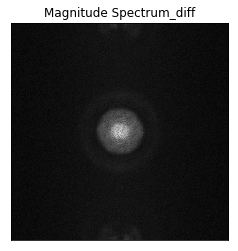

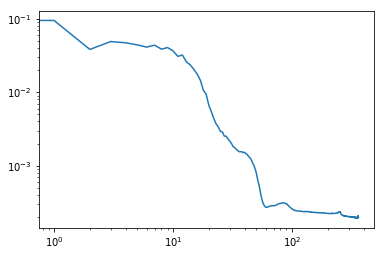

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019463 0.00019933 0.00020834 ... 0.00020376 0.00020834 0.00019933]
 [0.0001926  0.0001976  0.00017881 ... 0.00019971 0.00020675 0.00022016]
 [0.00017813 0.00021513 0.00018159 ... 0.00017833 0.00019269 0.00019213]
 ...
 [0.00019283 0.00018963 0.00018254 ... 0.00020927 0.00019487 0.00020231]
 [0.00017813 0.00019213 0.00019269 ... 0.00018389 0.00018159 0.00021513]
 [0.0001926  0.00022016 0.00020675 ... 0.00019219 0.00017881 0.0001976 ]]
el max de R es 362


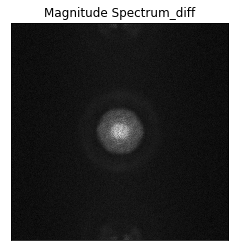

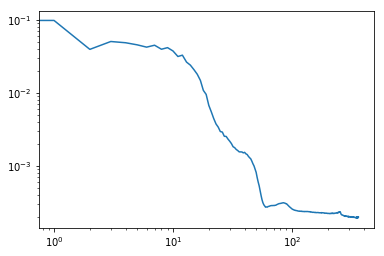

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00021752 0.00019549 0.00020779 ... 0.00021064 0.00020779 0.00019549]
 [0.00020887 0.00017943 0.00020848 ... 0.00021268 0.00019703 0.00021638]
 [0.00017901 0.00019532 0.00020958 ... 0.00019006 0.00019512 0.00018282]
 ...
 [0.00020842 0.00020165 0.00022194 ... 0.0001871  0.0001842  0.0001692 ]
 [0.00017901 0.00018282 0.00019512 ... 0.00021155 0.00020958 0.00019532]
 [0.00020887 0.00021638 0.00019703 ... 0.00017946 0.00020848 0.00017943]]
el max de R es 362


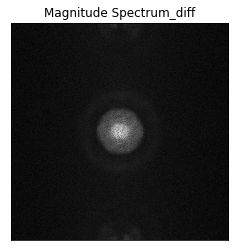

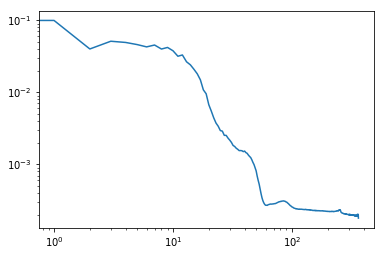

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020179 0.000183   0.00020822 ... 0.00020653 0.00020822 0.000183  ]
 [0.00020039 0.00020597 0.00021444 ... 0.00020203 0.00020125 0.00024114]
 [0.0001725  0.00019418 0.00020495 ... 0.00019192 0.00017685 0.00018188]
 ...
 [0.00021091 0.00022195 0.00022297 ... 0.00021119 0.00019392 0.00016702]
 [0.0001725  0.00018188 0.00017685 ... 0.00020839 0.00020495 0.00019418]
 [0.00020039 0.00024114 0.00020125 ... 0.00018218 0.00021444 0.00020597]]
el max de R es 362


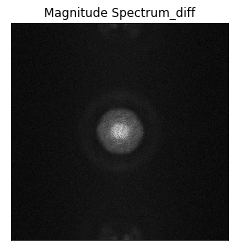

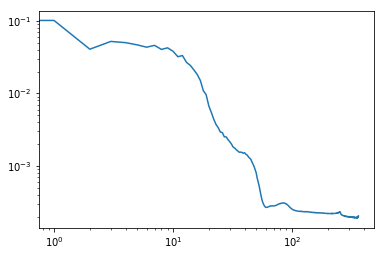

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019836 0.00018414 0.00019527 ... 0.00018934 0.00019527 0.00018414]
 [0.00018551 0.00017089 0.00021594 ... 0.00020556 0.00017835 0.00021633]
 [0.00017598 0.00020902 0.00021453 ... 0.00019744 0.0002021  0.00019196]
 ...
 [0.00019532 0.00020881 0.00020083 ... 0.00020372 0.00020134 0.00018197]
 [0.00017598 0.00019196 0.0002021  ... 0.00021094 0.00021453 0.00020902]
 [0.00018551 0.00021633 0.00017835 ... 0.00017918 0.00021594 0.00017089]]
el max de R es 362


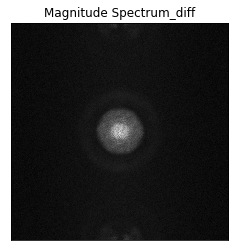

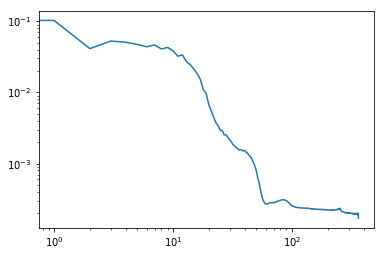

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00018818 0.00018413 0.00020211 ... 0.00019496 0.00020211 0.00018413]
 [0.00017644 0.00019632 0.00020405 ... 0.00020621 0.00017641 0.00023754]
 [0.00017692 0.0002296  0.00018443 ... 0.00016886 0.00018636 0.00016233]
 ...
 [0.00017748 0.00022207 0.00019696 ... 0.0002203  0.0001938  0.00019058]
 [0.00017692 0.00016233 0.00018636 ... 0.00018038 0.00018443 0.0002296 ]
 [0.00017644 0.00023754 0.00017641 ... 0.00018071 0.00020405 0.00019632]]
el max de R es 362


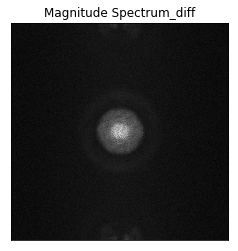

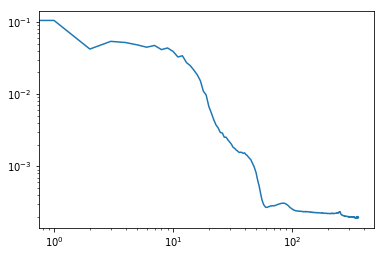

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00020417 0.00018537 0.00020054 ... 0.00020714 0.00020054 0.00018537]
 [0.00019008 0.00018434 0.00021581 ... 0.00020994 0.00018161 0.00020469]
 [0.00018698 0.00020004 0.00020923 ... 0.00016855 0.00021022 0.00017142]
 ...
 [0.00017367 0.00022202 0.00019874 ... 0.00018735 0.00020009 0.00018363]
 [0.00018698 0.00017142 0.00021022 ... 0.00017759 0.00020923 0.00020004]
 [0.00019008 0.00020469 0.00018161 ... 0.00017653 0.00021581 0.00018434]]
el max de R es 362


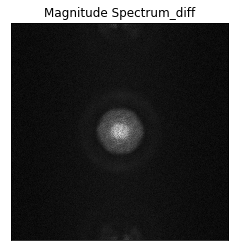

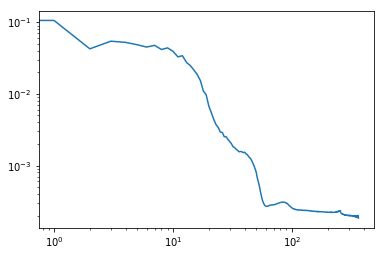

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.0002374  0.00020688 0.00020387 ... 0.00020175 0.00020387 0.00020688]
 [0.00020166 0.00019099 0.0002118  ... 0.00021627 0.00019829 0.00019303]
 [0.00016428 0.00019917 0.00020227 ... 0.0001831  0.00019028 0.00019325]
 ...
 [0.0002004  0.00020449 0.00021642 ... 0.00020681 0.00019747 0.00017732]
 [0.00016428 0.00019325 0.00019028 ... 0.00019856 0.00020227 0.00019917]
 [0.00020166 0.00019303 0.00019829 ... 0.00017881 0.0002118  0.00019099]]
el max de R es 362


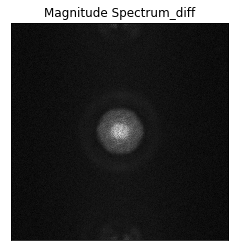

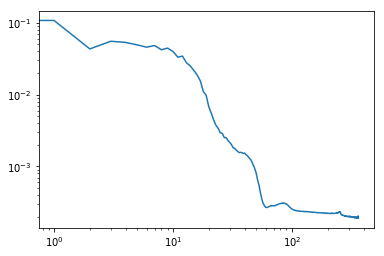

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019667 0.00019755 0.00022429 ... 0.0002044  0.00022429 0.00019755]
 [0.00019544 0.00020282 0.00019595 ... 0.00021369 0.00019904 0.00022103]
 [0.00017119 0.00021662 0.00022333 ... 0.00018563 0.00018032 0.00019091]
 ...
 [0.00019979 0.000214   0.00021371 ... 0.00019297 0.00018852 0.00017591]
 [0.00017119 0.00019091 0.00018032 ... 0.00020337 0.00022333 0.00021662]
 [0.00019544 0.00022103 0.00019904 ... 0.0001701  0.00019595 0.00020282]]
el max de R es 362


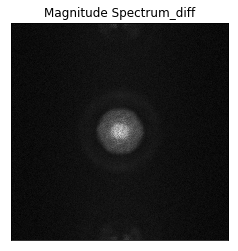

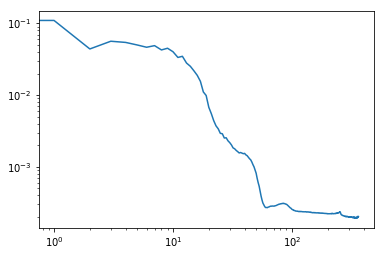

(512, 512)
0
rravel es  [360 359 359 ... 360 361 362]
mag spe es [[0.00019177 0.0002011  0.00018918 ... 0.00020414 0.00018918 0.0002011 ]
 [0.00017635 0.00021781 0.00018017 ... 0.00020485 0.00018949 0.00023088]
 [0.0001685  0.00021315 0.00020049 ... 0.00018795 0.00017704 0.00019614]
 ...
 [0.00021897 0.00021777 0.00020184 ... 0.00019186 0.00019063 0.00018517]
 [0.0001685  0.00019614 0.00017704 ... 0.00020853 0.00020049 0.00021315]
 [0.00017635 0.00023088 0.00018949 ... 0.0001679  0.00018017 0.00021781]]
el max de R es 362


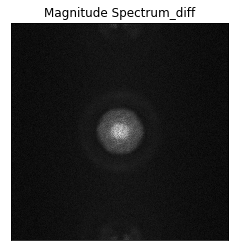

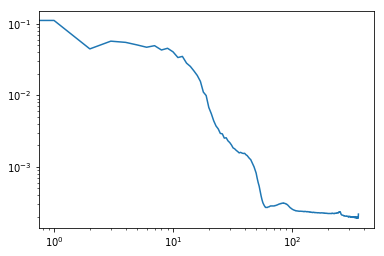

The array then is  [[0.0006144  0.00062376 0.00067147 ... 0.00020632 0.00019624 0.00020078]
 [0.00089632 0.00094489 0.00104508 ... 0.00020126 0.0001903  0.0002002 ]
 [0.0012047  0.00121636 0.00137374 ... 0.00020134 0.00019147 0.00018468]
 ...
 [0.02098435 0.10811333 0.04337623 ... 0.00019375 0.00020488 0.00019099]
 [0.02142707 0.10994539 0.04401642 ... 0.00020045 0.00020139 0.00020282]
 [0.02196514 0.11178111 0.04467545 ... 0.0001956  0.00019269 0.00021781]]


In [3]:
#Arreglo para evaluar DICF
DICF_array = np.zeros([num_intervals-1,363]) 
l=0
m=pixels

for n in range(0,num_intervals-1):
    magnitude_spectrum_diff_2 = np.fft.fftshift(Fourier_sp_diff[l:m,:])        
    center = [(pixels/2) - 1, (pixels/2) -1]
    print(magnitude_spectrum_diff_2.shape)
#q_x,q_y = np.meshgrid(shap2,shap2,sparse = True)
    Y, X = np.indices((magnitude_spectrum_diff_2.shape))    
    R = np.sqrt((X - center[0])**2 + (Y - center[1])**2)
    R = R.astype(np.int)
   
    print(np.min(R))
    Tbin = np.bincount(R.ravel(), magnitude_spectrum_diff_2.ravel())
    print("rravel es ", R.ravel())
    print("mag spe es", magnitude_spectrum_diff_2)
    NR = np.bincount(R.ravel())
    Radialprofile = Tbin / NR
    print("el max de R es",np.max(R))
    plt.plot(),plt.imshow(20*cv.log(magnitude_spectrum_diff_2), cmap = 'gray')
    plt.title('Magnitude Spectrum_diff'), plt.xticks([]), plt.yticks([])
    plt.show()
    l = l+pixels
    m = m+pixels
    T = np.linspace(0,362,num = 363)
    plt.loglog(T,Radialprofile , label ='linear')
    plt.show()
    DICF_array[n,:] = Radialprofile

print("The array then is ", DICF_array)

In [6]:
print(np.size(A_q_F))

85


2.3277401940601536
[5.88354249e+00 9.99965614e-01 1.66523792e-04 1.34140413e-03]


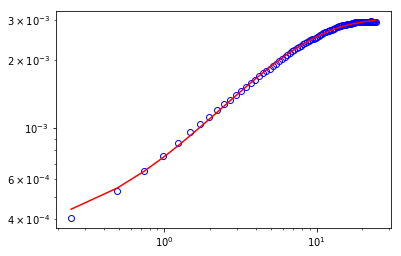

2.42084980182256
[5.53908534e+00 9.99999943e-01 1.48616400e-04 1.33543375e-03]


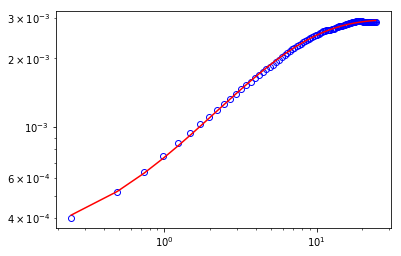

2.5139594095849658
[5.47672013e+00 9.64607612e-01 1.62377416e-04 1.13737692e-03]


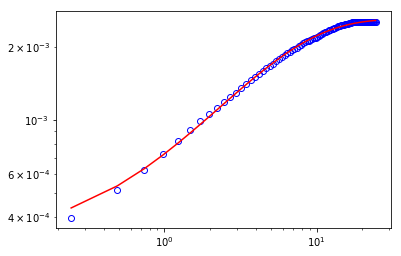

2.607069017347372
[5.34388041e+00 9.44778193e-01 1.49214521e-04 1.14301970e-03]


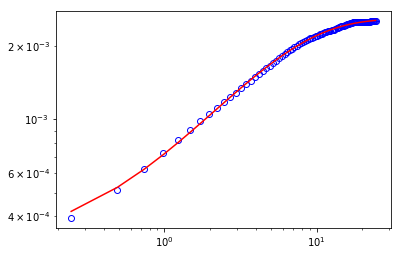

2.7001786251097784
[4.80718711e+00 9.53141645e-01 1.51944294e-04 1.03521812e-03]


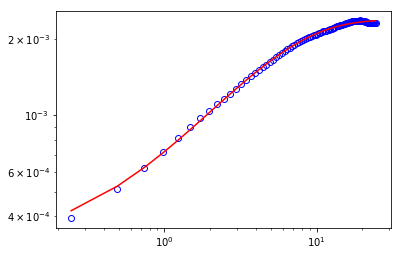

2.793288232872184
[4.49000870e+00 9.17483268e-01 1.39414693e-04 9.55826459e-04]


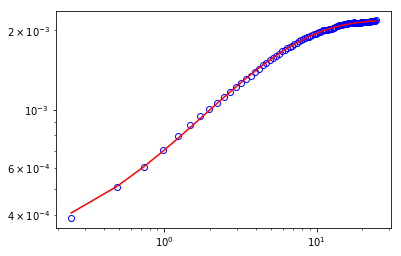

2.88639784063459
[3.97819132e+00 8.78620097e-01 1.23858309e-04 8.91716421e-04]


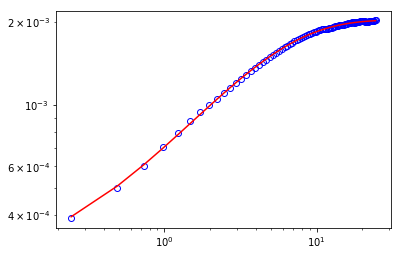

2.9795074483969963
[3.47130420e+00 8.30522925e-01 1.01800357e-04 8.13391552e-04]


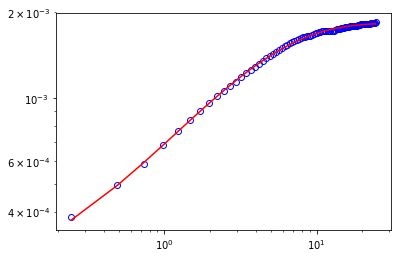

3.0726170561594026
[3.36866311e+00 8.29779840e-01 1.05045847e-04 7.83149956e-04]


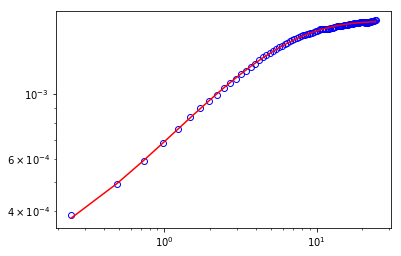

3.165726663921809
[3.06234788e+00 8.64287644e-01 1.11581024e-04 7.29674902e-04]


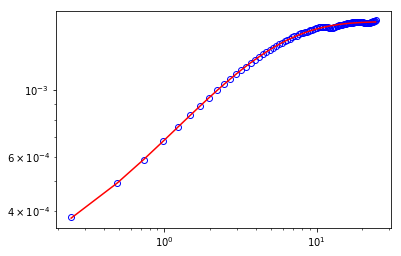

3.2588362716842147
[2.86327948e+00 8.51324050e-01 1.09090948e-04 6.98665976e-04]


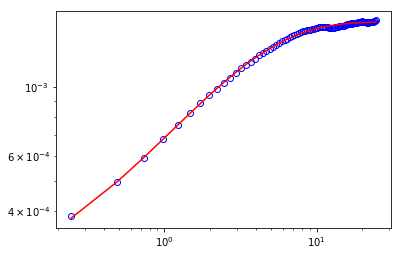

3.351945879446621
[2.59816559e+00 8.07423135e-01 8.98561677e-05 6.86614154e-04]


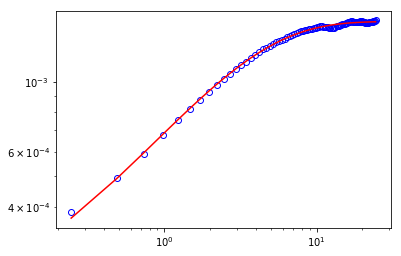

3.4450554872090273
[2.56746064e+00 8.13338715e-01 9.31119227e-05 6.81977794e-04]


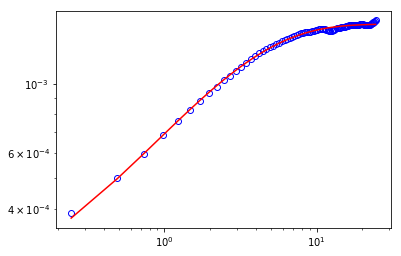

3.538165094971433
[2.34318968e+00 6.40437768e-01 1.98214982e-05 7.57070391e-04]


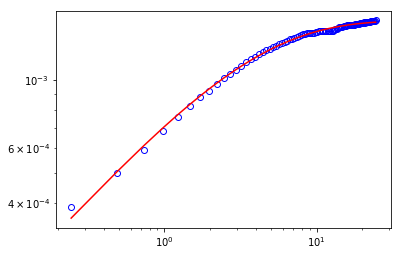

3.6312747027338395
[2.33585335e+00 7.30855643e-01 6.48205410e-05 6.83955092e-04]


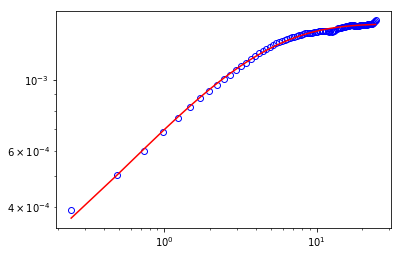

3.7243843104962457
[2.19815654e+00 6.19468098e-01 5.49173676e-06 7.64336528e-04]


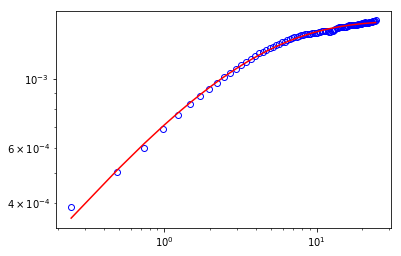

3.8174939182586516
[1.95714495e+00 6.05744713e-01 5.00000032e-09 7.29476829e-04]


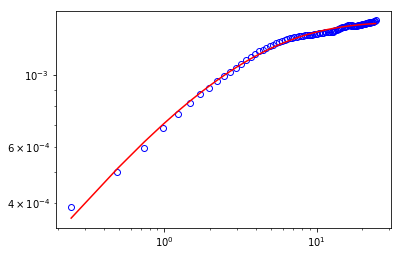

3.9106035260210583
[1.93710930e+00 6.16383987e-01 4.80203539e-06 7.12529176e-04]


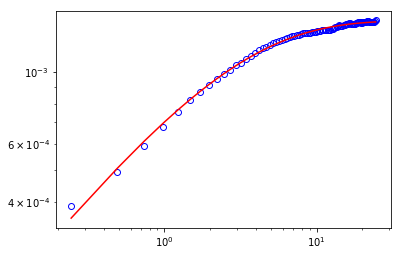

4.003713133783464
[1.86058732e+00 6.29823795e-01 1.66232113e-05 6.60740364e-04]


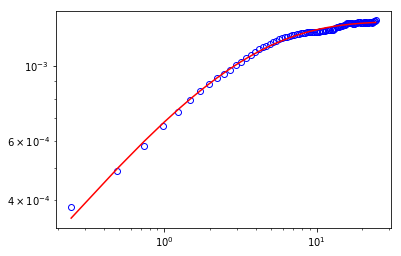

4.09682274154587
[1.80651535e+00 6.59044631e-01 3.27328988e-05 6.14289606e-04]


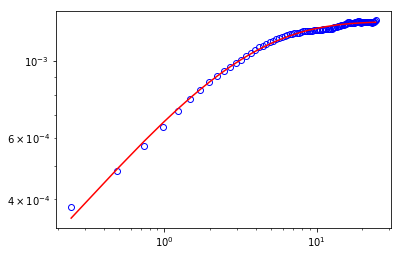

4.189932349308276
[1.88833721e+00 6.95018446e-01 5.65691495e-05 5.62387461e-04]


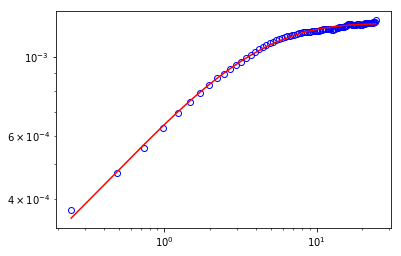

4.283041957070682
[1.81940528e+00 6.82075206e-01 5.87280115e-05 5.16769174e-04]


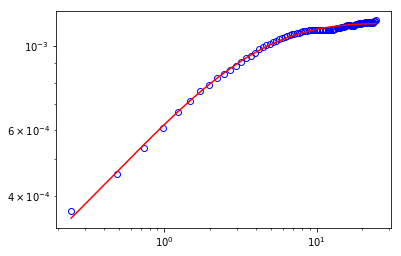

4.376151564833089
[1.83003220e+00 7.65852231e-01 9.23403300e-05 4.30358098e-04]


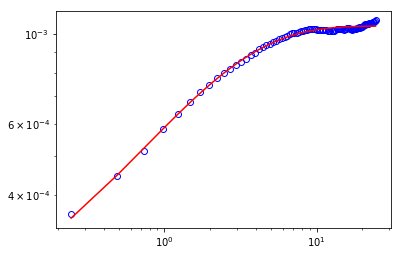

4.469261172595495
[1.78295675e+00 7.48331755e-01 8.62467869e-05 4.01880525e-04]


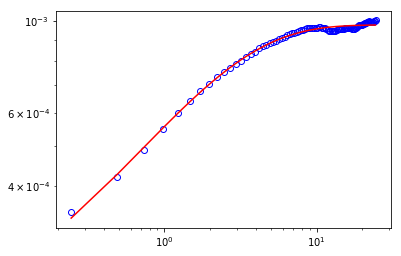

4.562370780357901
[1.87563904e+00 7.83732372e-01 1.09742068e-04 3.30539989e-04]


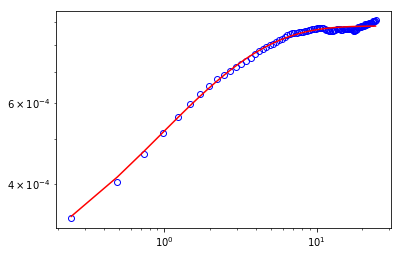

4.655480388120307
[1.69006615e+00 7.21100870e-01 9.09684844e-05 3.07575643e-04]


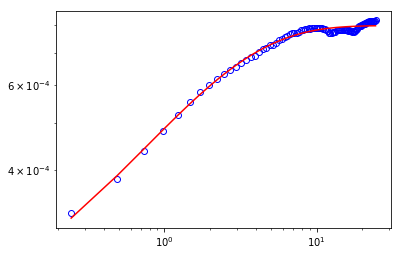

4.748589995882713
[1.87361962e+00 8.64189994e-01 1.21078471e-04 2.23145483e-04]


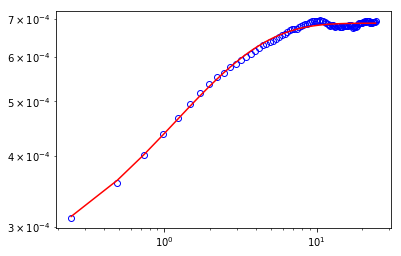

4.84169960364512
[1.81881780e+00 9.64502052e-01 1.29387907e-04 1.69442494e-04]


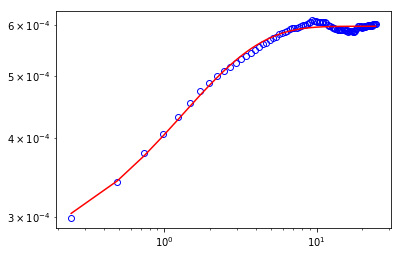

4.934809211407526
[1.87135484e+00 9.03706088e-01 1.26134863e-04 1.38384124e-04]


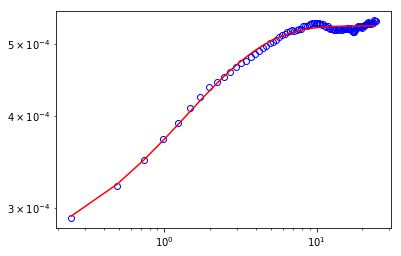

5.0279188191699316
[1.89585515e+00 9.92979482e-01 1.31687880e-04 9.69685706e-05]


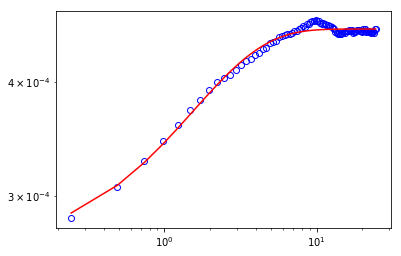

In [6]:
#beta = 1
import math 
i=0
num = 30
ini = 25
Q = np.zeros([num])
#A_q_DICF = np.zeros([num])
B_q_DICF = np.zeros([num])
apo_2 = np.linspace(timestep, timestep*num_intervals, num_intervals-1)
apo22 = np.linspace(0.01, timestep*num_intervals, (num_intervals-1)*10)
f_q = np.zeros([num, np.size(DICF_array[:,1])])
f_q_fit = np.zeros([num, np.size(apo22)])
dif_coef = 0;
Time = np.zeros([num])
Betas = np.zeros([num])
for h in range(ini,ini + num,1):
    alli_2 = DICF_array[:,h]
    plt.loglog(apo_2, alli_2,'bo',ms = 6, fillstyle = 'none', label='linear')
    
    
    q = (2*np.pi)*h/(d_pix*512)
    
    
    
    def func( x, tau, beta, B, A_fit):
        return 2*A_fit*(1 - np.exp(-(x/tau)**beta)) + 2*B
        #return 2*A_q_F[i]*(1 - np.exp(-(x/tau)**beta)) +2*B
        #return 2*A_q_F[i]*(1-np.exp(-x*(q**2)*D)) + 2*B
        #return 2*A_q_F[i]*(1-np.exp(-(x*(q**2)*D)**beta)) + 2*B
    print(q)
    popt, pcov = curve_fit(func, apo_2[:], alli_2[:],bounds=([0.9, 0.6, 0.000000005, 0.000003], [7.0 , 1.0, 0.01 , 0.1]), method = 'trf')
    #popt, pcov = curve_fit(func, apo_2, alli_2,  method = 'lm')
    print(popt)
    #dif_coef = dif_coef+popt[1]
    plt.loglog(apo_2, func(apo_2, *popt), 'r-',
             label='fit: tau=%5.3f, beta=%5.3f, B=%5.3f, A_fit=%5.3f' % tuple(popt))
    
    
    f_q[i,:] = 1 - (DICF_array[:,h] - 2*popt[2])/(2*popt[3])
    f_q_fit[i,:] = np.exp(-((apo22/popt[0])**popt[1]))
    #l=1/(popt[0]*q**2)
    Q[i] = q 
    Betas[i] = popt[1]
    B_q_DICF[i] = popt[2]
    Time[i] = popt[0]*math.gamma(1/popt[1])/popt[1]
    i=i+1        
    plt.show()
    
#def func2(Z,Dif):
    #return 1/(Dif*Z**2)
#popt_D, pcov_D = curve_fit(func2, Q, Time) 

#print(popt_D)
#dif_coef = dif_coef/len(Q) 


#plt.show()
#plt.loglog(Q,Time, 'bo',fillstyle = 'none', ms = 7, label = 'Measurements') 
#plt.loglog(Q, func2(Q, *popt_D), 'r-', label = 'Fit')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'$\tau$ (s)')
#plt.legend(loc='upper right')
plt.show()
#plt.loglog(Q, A_q_F, 'bP', ms = 6, label = 'A(q)')
#plt.loglog(Q,B_q_DICF,'r.', ms = 6, label = 'B(q)')
#plt.xlabel(r'q ($1/\mu m$)')
#plt.ylabel(r'Arb units')
#plt.legend(loc = 'upper right')


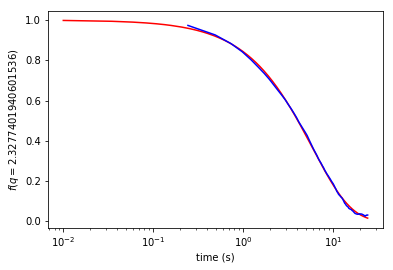

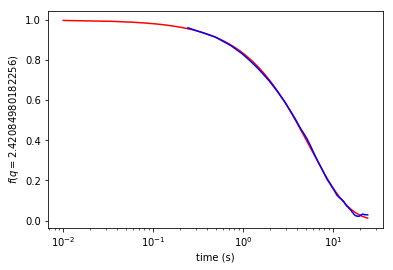

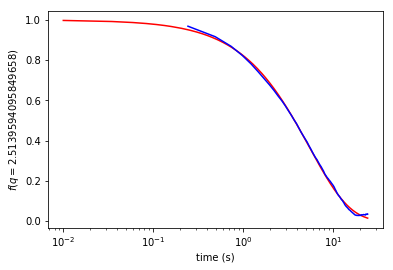

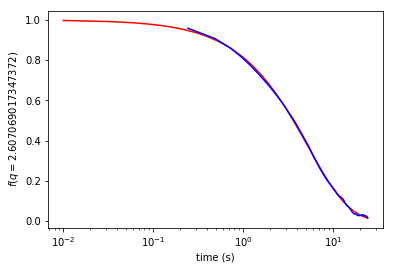

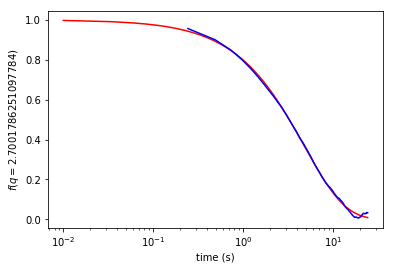

...

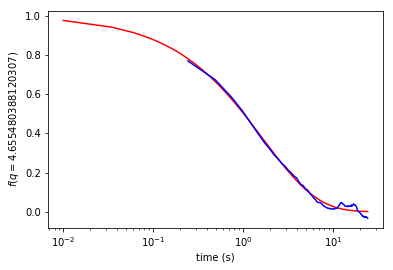

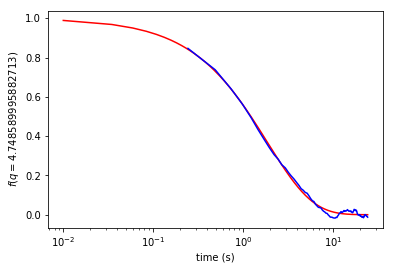

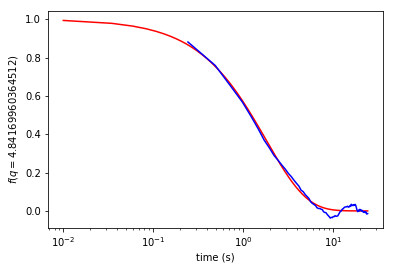

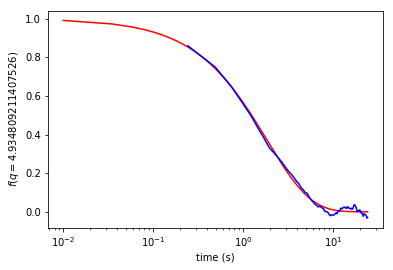

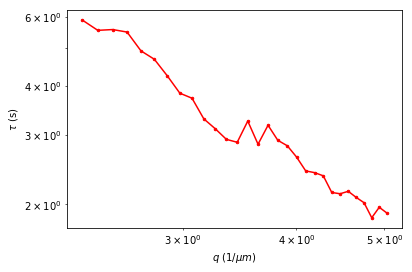

0.8092839936807451


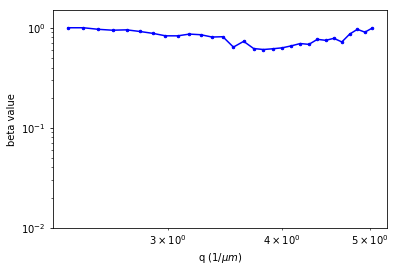

In [7]:
plt.show()
for qs in range ( 0, num -1 ):
    plt.show()
    plt.semilogx(apo22, f_q_fit[qs,:],'r-', ms = 5)
    plt.semilogx(apo_2, f_q[qs,:],'b-', ms = 5)
    plt.xlabel(r'time (s)')
    plt.ylabel(r'$f(q =$' + str((2*np.pi)*(qs + ini)/(d_pix*512))+')')
    #print(f_q_fit[qs,:])
    np.savetxt(Filename + 'f_q_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*512))+ '.txt', np.c_[apo_2,f_q[qs,:]])
    np.savetxt(Filename + 'f_q_fit_2_2_' + str((2*np.pi)*(qs + ini)/(d_pix*512))+ '.txt', np.c_[apo22,f_q_fit[qs,:]])

    





plt.show()
plt.loglog(Q, Time, 'r.-', ms = 5)
plt.xlabel(r'$q$ ($1/ \mu m$)')
plt.ylabel(r'$\tau$ (s)')
plt.show()
plt.loglog(Q, Betas,'b.-', ms = 5)
plt.ylim((0.01, 1.5)) 
plt.xlabel(r'q ($1/ \mu m$)')
plt.ylabel(r'beta value')
media_bet = np.mean(Betas[:])
print(media_bet)

In [11]:
np.savetxt(Filename + 'tau_vs_q2_2' + '.txt', np.c_[Q**2, Time])
np.savetxt(Filename + 'beta_vs_q_2' + '.txt', np.c_[Q, Betas])
np.savetxt(Filename + 'tau_vs_q_single_2' + '.txt', np.c_[Q, Time])
#np.savetxt(Filename + 'tau_vs_q2_3da' + '.txt', np.c_[Q**2, Time])
#np.savetxt(Filename + 'beta_vs_q_3da' + '.txt', np.c_[Q, Betas])